# Extractive QA



1. Scraping Dell Website (Data Collection)
1. Cleaning dataset
1. QA Fromatting using Haystack Annotation tool (SQUAD format)
1. Tokenisation, DocumentStore (FAISS, InMemoryDocumentStore), Retriever (DPR), Reader (FARMReader)

# Scraping

In [1]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import re
import uuid
import os
from tqdm import tqdm

import time
from selenium import webdriver
# for headless
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC

import json

In [2]:
headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/86.0.4240.75 Safari/537.36'}



# url = 'https://www.dell.com/community/PowerEdge-Hardware-General/PowerEdge-R730XD-Loading-BIOS-Drivers/m-p/7644944#M65318'
url = 'https://www.dell.com/community/PowerEdge-Hardware-General/bd-p/PowerEdge-General-HW'
r = requests.get(url, headers=headers)
soup = BeautifulSoup(r.text, 'html.parser')

print(soup.title.text)


	PowerEdge Hardware General - Dell Community



In [55]:
# Set pandas options to display all columns and rows without truncation
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

### Dell Website: Scraping for URLs

- For this project will exclusivley look at Hardware Dell suppport forums, we could later incorporate other fields such as Software issues and label entries as such. But for now, focusing on Hardware `https://www.dell.com/community/PowerEdge-Hardware-General/bd-p/PowerEdge-General-HW`.
- 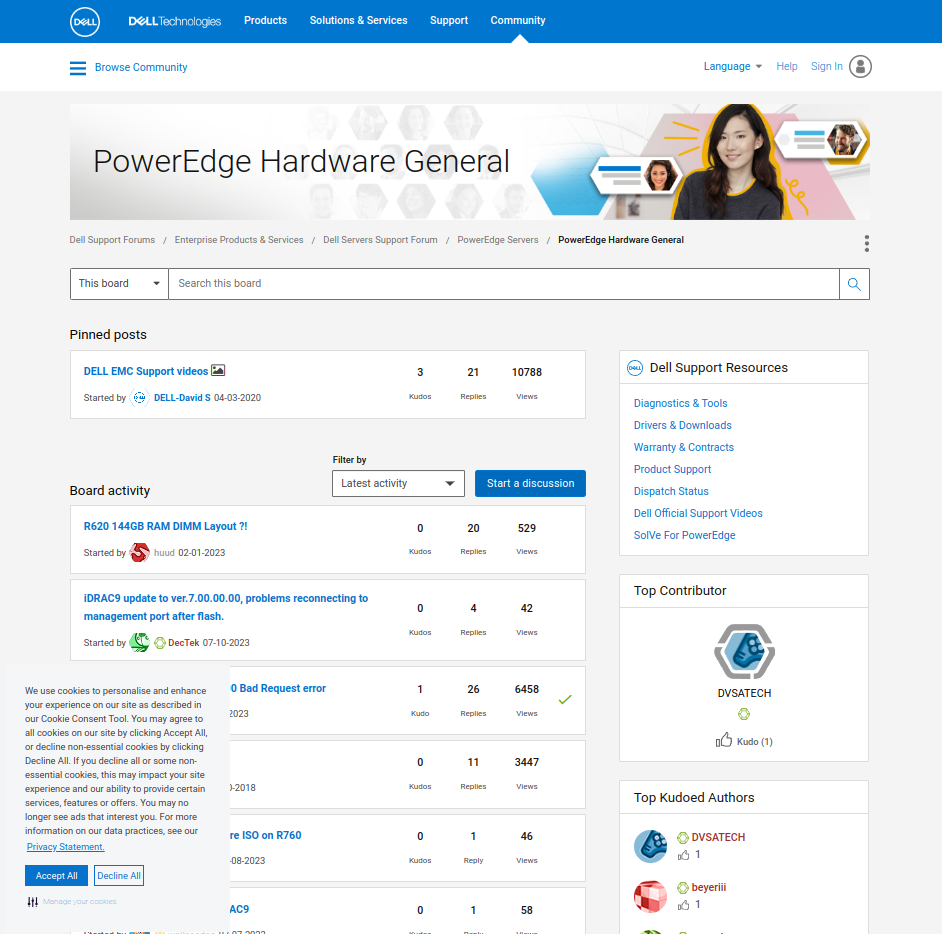
- We want to land on the website and pull `URLs` of Solved Dell forum posts and save them as a list (search for HTML elements `//a[@href]`.
- As this internet network is based in **EU**, there is a `Accept Cookies` button that can pop up when the webpage is first openedthat needs to be clicked.
- Using the Selium library, will first filter by `Solved` cases in order to scrape forums that have a solution (using Chrome Developer tool helps identify the HTML element names):
- 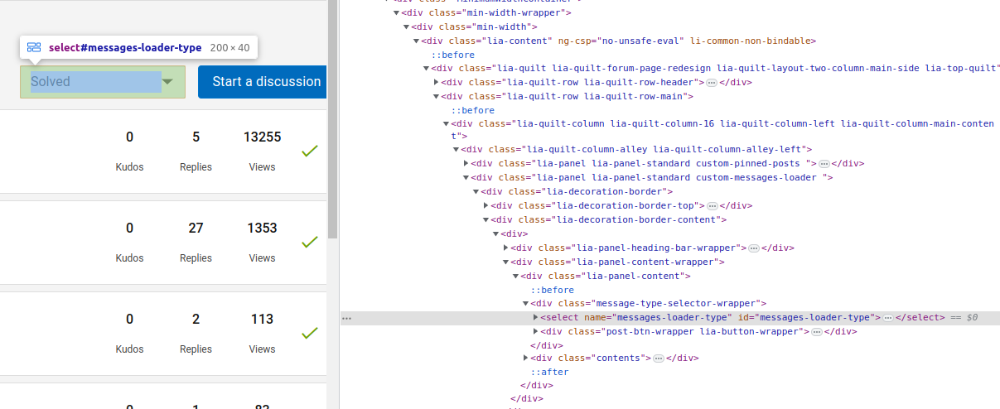
- After Solved button will need to scroll down to `Load More`. Note a `MoveTargetOutOfBoundsException` error can occur when the scroll action goes beyond the bounds of the webpage. To avoid this error, we can try a different approach by scrolling to the bottom of the page using `execute_script()` and then clicking the "Load more" button. The parameter `num_clicks` which indicates the number of times to click the "Load more" button.

> One issue, as we click Load More, the website length increases until eventually we cant scroll down to the bottom fast enough in order to click Load More again. As we increase `num_clicks` to be `>90` we hit an error because we are not giving the function enough time, using `time.sleep()`, to scroll down the increasingly larger webpage `ElementClickInterceptedException`. To resolve this we scroll the element into view using the `execute_script` method. This ensures that the element is visible and clickable (`driver.execute_script("arguments[0].scrollIntoView();", load_more_button)
`). 



In [41]:
def automate_dell_forum(num_clicks):
    # Instantiate the Selenium web driver
    driver = webdriver.Chrome()
    driver.maximize_window()  # Maximize the browser window

    # Navigate to the Dell community forum page
    driver.get('https://www.dell.com/community/PowerEdge-Hardware-General/bd-p/PowerEdge-General-HW')

    # Press the "Accept All" button for cookies
    accept_button = WebDriverWait(driver, 10).until(EC.element_to_be_clickable((By.XPATH, '//a[@aria-label="allow cookies"]')))
    accept_button.click()
    
    # Select the "Solved" option from the dropdown
    select_element = driver.find_element(By.ID, 'messages-loader-type')
    option_solved = select_element.find_element(By.XPATH, "//option[@value='solved']")
    option_solved.click()

    # Wait for the page to load after selecting "Solved" option
    time.sleep(2)

    # Scroll to the bottom of the page
    print("scrolled outside loop")
    driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")

    # Wait for a few seconds BEFORE clicking the "Load more" button
    print("wait(2) outside before loop")
    time.sleep(2)
    

    # Click the "Load more" button the specified number of times
    count = 1
    
    for _ in range(num_clicks):
        load_more_button = WebDriverWait(driver, 10).until(EC.element_to_be_clickable((By.ID, 'btn-load-more')))
        print("Waiting... for a few seconds BEFORE clicking the Load more button")
        time.sleep(3)
        print("Wait befor done")
        driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
        print("scrolled in loop at", count)
        time.sleep(3)
        print("waited 2 secs after scroll")
        load_more_button.click()
        count += 1
        print("clicked: ", count)
        print("Waiting... for a few seconds AFTER clicking the Load more button")
        time.sleep(6)
        print("Wait after done")
    
        
    
    # Wait for the page to load AFTER clicking "Load more" button
    #print("Waiting... for a few seconds AFTER clicking the Load more button")
    print("wait(2) outside after loop")

    time.sleep(2)
    
    #print("Wait after done")
    

    # Get all href urls on the page and save them to a list
    urls = driver.find_elements(By.XPATH, '//a[@href]')
    url_list = [url.get_attribute('href') for url in urls]

    # Close the Selenium web driver
    driver.quit()

    return url_list

# Call the method to automate the process and get the url list, num_of_clicks=
url_list = automate_dell_forum(189)

# Print the urls (forum posts)
#for url in url_list:
#    print(url)

scrolled outside loop
wait(2) outside before loop
Waiting... for a few seconds BEFORE clicking the Load more button
Wait befor done
scrolled in loop at 1
waited 2 secs after scroll
clicked:  2
Waiting... for a few seconds AFTER clicking the Load more button
Wait after done
Waiting... for a few seconds BEFORE clicking the Load more button
Wait befor done
scrolled in loop at 2
waited 2 secs after scroll
clicked:  3
Waiting... for a few seconds AFTER clicking the Load more button
Wait after done
Waiting... for a few seconds BEFORE clicking the Load more button
Wait befor done
scrolled in loop at 3
waited 2 secs after scroll
clicked:  4
Waiting... for a few seconds AFTER clicking the Load more button
Wait after done
Waiting... for a few seconds BEFORE clicking the Load more button
Wait befor done
scrolled in loop at 4
waited 2 secs after scroll
clicked:  5
Waiting... for a few seconds AFTER clicking the Load more button
Wait after done
Waiting... for a few seconds BEFORE clicking the Load 

In [42]:
import csv

with open('list_189.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(url_list)

In [43]:
with open('list_189.txt', 'w') as file:
    for item in url_list:
        file.write(str(item) + '\n')

In [44]:
len(url_list) #189

7675

In [26]:
len(url_list)

3713

In [ ]:
clicked_200 = url_list[:]

In [27]:

clicked_90 = url_list[:]



In [ ]:
len(clicked_90)

In [18]:
len(execute_script_10)

113

In [14]:
len(clicked__urls_60)

2513

In this updated version, the waiting time after clicking the "Load more" button is dynamically increased by adding a fraction (0.5 seconds) of the current click count (count) to the base waiting time of 3 seconds. This ensures that the waiting time increases as more clicks are made, allowing the webpage to load fully before attempting to click again. Adjust the fraction (0.5) as needed based on your observations of the webpage loading time.

### Dell Website: Filter  and clean URLs

- 

In [45]:
def filtered_urls(url_list):
    filtered_urls = []
    exclude_urls = [
        'https://www.dell.com/community/PowerEdge-Hardware-General/bd-p/PowerEdge-General-HW#',
        'https://www.dell.com/community/PowerEdge-Hardware-General/bd-p/custom.dell.link.solutions.href',
        'https://www.dell.com/community/PowerEdge-Hardware-General/bd-p/custom.dell.link.careers.href',
        'https://www.dell.com/community/PowerEdge-Hardware-General/bd-p/custom.dell.link.about.href',
        'https://www.dell.com/community/PowerEdge-Hardware-General/bd-p/PowerEdge-General-HW'
    ]
    for url in url_list:
        if url.startswith('https://www.dell.com/community/PowerEdge-Hardware-General/') and url not in exclude_urls:
            filtered_urls.append(url)
    return filtered_urls

# Filter the urls
filtered_urls = filtered_urls(url_list)

In [46]:
len(filtered_urls)

1901

### Dell website: Visit forum post and pull Answers, Question text and URLs linking to Support documents (Context)

- We want to structure the dataset as Question (the forum query asked by a user), Answer (The community agreed solution) and importantly what we will be calling Context (the text pulled from a linked suppporting artcile). But the website stricture is a little messy, but after some trial and error was able to identify that:
    - The first `lia-message-body-content` always references the Question
    - The second `lia-message-body-content` is always the pinned answer (for "Solved" forum posts)
    - So we will simple combine and save the first `lia-message-body-content` into Questions and the second into Answers
    - Any refered to `https://` in the Answer to be saved for later use as Context.
- 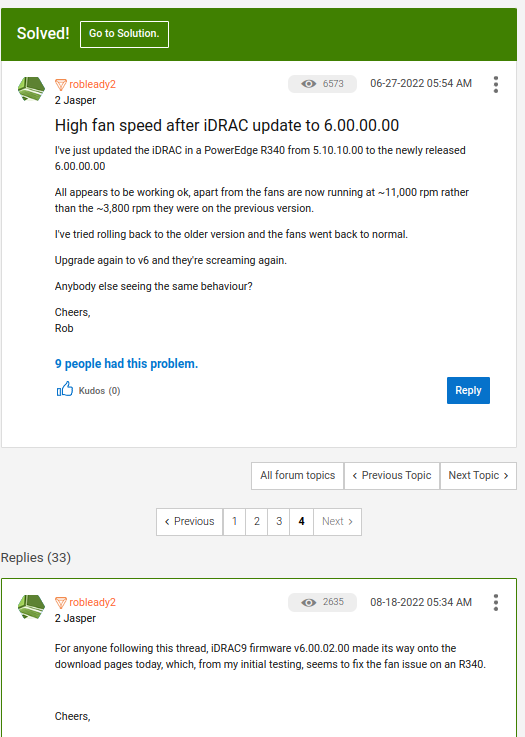

To speed up the `extract_elements_with_class` function and incorporate tqdm for a progress bar, you can make the following modifications:

1. Use `tqdm` to create a progress bar: Import the `tqdm` module and wrap the `urls` list with `tqdm` to create a progress bar that shows the status of the extraction process.

2. Utilize `Session` object from the `requests` module: Instead of creating a new `requests` session for each URL, you can use a `Session` object to take advantage of connection pooling and improve performance.

3. Use `find` instead of `find_all`: Since you only need the first two elements with the specified class name, you can use `find` instead of `find_all` to improve performance.

Here's the modified code:

```python
from tqdm import tqdm
import requests
import pandas as pd
from bs4 import BeautifulSoup

def extract_elements_with_class(urls, class_name):
    elements_list = []
    session = requests.Session()
    for url in tqdm(urls, desc="Extracting elements"):
        try:
            response = session.get(url)
            soup = BeautifulSoup(response.content, 'html.parser')
            elements = soup.find_all(class_=class_name, limit=2)  # Limit to the first two elements
            for element in elements:
                elements_list.append(element.text.strip())
            for _ in range(2 - len(elements)):
                elements_list.append("")  # Append empty strings if elements are not found
        except requests.exceptions.RequestException:
            elements_list.extend(["", ""])  # Append empty strings if there's an error
    return elements_list

class_name = "lia-message-body-content"
extracted_elements = extract_elements_with_class(filtered_urls, class_name)

# Ensure extracted_elements has an even number of elements
if len(extracted_elements) % 2 != 0:
    extracted_elements.append("")  # Append an empty string to make it even

# Split the extracted elements into Questions and Answers lists
Questions = extracted_elements[::2]
Answers = extracted_elements[1::2]

# Create a dataframe called QA
QA = pd.DataFrame({"Questions": Questions, "Answers": Answers})
```

In the modified code, `tqdm` is used to create a progress bar that shows the status of the extraction process. The `requests.Session()` object is created outside the loop to take advantage of connection pooling. Additionally, `find_all` is limited to the first two elements (`limit=2`), and the empty strings are appended using a loop to ensure there are always two elements for each URL.

These modifications should improve the speed of the function and provide a progress bar using `tqdm` to monitor the extraction process.

In [47]:
from tqdm import tqdm
import requests
import pandas as pd
from bs4 import BeautifulSoup

def extract_elements_with_class(urls, class_name):
    elements_list = []
    session = requests.Session()
    for url in tqdm(urls, desc="Extracting elements"):
        try:
            response = session.get(url)
            soup = BeautifulSoup(response.content, 'html.parser')
            elements = soup.find_all(class_=class_name, limit=2)  # Limit to the first two elements
            for element in elements:
                elements_list.append(element.text.strip())
            for _ in range(2 - len(elements)):
                elements_list.append("")  # Append empty strings if elements are not found
        except requests.exceptions.RequestException:
            elements_list.extend(["", ""])  # Append empty strings if there's an error
    return elements_list

class_name = "lia-message-body-content"
extracted_elements = extract_elements_with_class(filtered_urls, class_name)

# Ensure extracted_elements has an even number of elements
if len(extracted_elements) % 2 != 0:
    extracted_elements.append("")  # Append an empty string to make it even

# Split the extracted elements into Questions and Answers lists
Questions = extracted_elements[::2]
Answers = extracted_elements[1::2]

# Create a dataframe called QA
QA_large = pd.DataFrame({"Questions": Questions, "Answers": Answers})

Extracting elements: 100%|██████████| 1901/1901 [54:27<00:00,  1.72s/it] 


In [48]:
QA_large.head()

,Questions,Answers
0,"We provide you a variety of support related videos on our DELL EMC Support YouTube channel. We publish at least one new video every week so make sure you subscribe and stay up to date with the latest turoials, tipps and tricks about server, storage and networking.\n \nHere are some playlist you might find helpful for your daily business regarding DELL EMC Enterprise hardware.\n\nOpenManage Server Administrator \nRAID - Tutorials, Information and Troubleshooting \nDell EMC QuickTips - something about everything \niDRAC - Setup, Configuration, Troubleshooting \nDell Lifecycle Controller \nSupportAssist Enterprise Virtual Edition \n\nYou can find the full list here.\n \nSomething is missing? Got a topic we should cover in one of our videos? Feel free to suggest new topics and give us feedback to existing ones in this thread.","Hi All,\nthere are 2 new videos up on the channel. As always a Quick Tip Video on Service Tag locations and in addition we show you how to install OMSA on ESXi 6.7\nAnd don't forget to like the videos and subscribe to our channel for all the latest updates!"
1,"Hello,We were asked by DELL supporter to update iDRAC again for a hardware support, from 6.02.00.00 to 6.10.00.00. After updating, the secure web access to iDRAC failed with error:Bad RequestYour browser sent a request that this server could not understand.Additionally, a 400 Bad Request error was encountered while trying to use an ErrorDocument to handle the request.After doing some tests, I have the following conclusions/workarounds:1. the secure web access failed when using the FQDN of iDRAC interface2. using the IP or short hostname works with the secure web access3. setting iDRAC.WebServer.ManualDNSEntry to have the FQDN included won't solve the issue4. disabling idrac.webserver.HostHeaderCheck aslo works, but could not open virtual console viewer I tried to use racadm command 'sslresetcfg' to regenerate the certificate, but only short hostname used as Common Name (CN) and also only the short hostname listed in the DNS alternative name. By the way, we have DNS BMC/RAC Name and DNS Domain name correctly configured.It looks like to me a new bug in version 6.10.00.00. Though there are not issues with the IP and short hostname access, it is still annoying since we have FQDN defined and linked everywhere. Thanks,Di\n\n\n\n\t\t\t\t\t\n\t\t\t\t\t\tSolved!\n\t\t\t\t\t\n\t\t\t\t\tGo to Solution.","Indeed, this seems fixed in later version. I just updated one of our nodes to version 6.10.80.00, the issue described in my first post has gone. When I was testing iDRAC version 6.10.30.00, the issue was sill there.\n\n\nView solution in original post"
2,"After a long power outage, the accountant decided to turn on the server on her own.After pressing the button ""i"" and holding it for a little longer, she reset the settings iDRAC along with the license.How can I restore it now? The server was purchased in 2014. Service Tag <Service Tag was removed>.\n \n\n\n\n\t\t\t\t\t\n\t\t\t\t\t\tSolved!\n\t\t\t\t\t\n\t\t\t\t\tGo to Solution.","Hi, Sergei 66,\n \niDRAC license was sent to you.\n \nPlease ask me if you have any questions, \n \nThank you,\nMaria Januszka\n#IWork4Dell\nDell | Social Outreach Services - Enterprise\n\nMaria JSocial Media and Communities Professional Dell Technologies | Enterprise Support Services #Iwork4Dell Did I answer your query? Please click on ‘Accept as Solution’‘Kudo’ the posts you like!\n\n\n\nView solution in original post"
3,"Hi Dell Team,We are currently experiencing an issue with the ServiceTag on our Dell server. When attempting to enter the tag on Dell's website, an error message stating ""Service Tag or Product ID Search Error"" is displayed. could you please advise? Best regards!\n\n\n\n\t\t\t\t\t\n\t\t\t\t\t\tSolved!\n\t\t\t\t\t\n\t\t\t\t\tGo to Solution.","It works now, Thank you so much Young E.Have a great day.\n\n\nView solution in original post"
4,"Hello! I want to perform a memory upgrade on my R6515

In [7]:
# import


# Read the CSV file into a DataFrame
QA_large = pd.read_csv("QA_large_cleaned.csv")

In [6]:
# export
QA_large.to_csv('QA_large_cleaned.csv', index=False)

NameError: name 'QA_large' is not defined

### Data Cleaning


- later we remove URLs containing `"tar.gz"`

In [9]:
# Create a new dataframe for cleaned data
QA_cleaned = QA_large.copy()

# Clean up the "Questions" and "Answers" columns
QA_cleaned['Questions'] = QA_cleaned['Questions'].str.replace('Go to Solution', '').str.replace('Solved!', '')
QA_cleaned['Questions'] = QA_cleaned['Questions'].str.replace('\n', '').str.replace('\t', '').str.replace('IWork4Dell', '')
QA_cleaned['Questions'] = QA_cleaned['Questions'].str.replace("Did I answer your query? Please click on ‘Accept as Solution’. ‘Kudo’ the posts you like!", '')

QA_cleaned['Answers'] = QA_cleaned['Answers'].str.replace("Did I answer your query? Please click on ‘Accept as Solution’. ‘Kudo’ the posts you like!", '')
QA_cleaned['Answers'] = QA_cleaned['Answers'].str.replace("View solution in original post", '')
QA_cleaned['Answers'] = QA_cleaned['Answers'].str.replace('\n', '').str.replace('\t', '').str.replace('#IWork4Dell', '')


/tmp/ipykernel_6694/3290180330.py:7: FutureWarning: The default value of regex will change from True to False in a future version.
  QA_cleaned['Questions'] = QA_cleaned['Questions'].str.replace("Did I answer your query? Please click on ‘Accept as Solution’. ‘Kudo’ the posts you like!", '')
/tmp/ipykernel_6694/3290180330.py:9: FutureWarning: The default value of regex will change from True to False in a future version.
  QA_cleaned['Answers'] = QA_cleaned['Answers'].str.replace("Did I answer your query? Please click on ‘Accept as Solution’. ‘Kudo’ the posts you like!", '')


In [34]:
# export
QA_cleaned.to_csv('QA_cleaned.csv', index=False)

In [10]:
QA_cleaned.head()

,Questions,Answers
0,"We provide you a variety of support related videos on our DELL EMC Support YouTube channel. We publish at least one new video every week so make sure you subscribe and stay up to date with the latest turoials, tipps and tricks about server, storage and networking. Here are some playlist you might find helpful for your daily business regarding DELL EMC Enterprise hardware.OpenManage Server Administrator RAID - Tutorials, Information and Troubleshooting Dell EMC QuickTips - something about everything iDRAC - Setup, Configuration, Troubleshooting Dell Lifecycle Controller SupportAssist Enterprise Virtual Edition You can find the full list here. Something is missing? Got a topic we should cover in one of our videos? Feel free to suggest new topics and give us feedback to existing ones in this thread.","Hi All,there are 2 new videos up on the channel. As always a Quick Tip Video on Service Tag locations and in addition we show you how to install OMSA on ESXi 6.7And don't forget to like the videos and subscribe to our channel for all the latest updates!"
1,"Hello,We were asked by DELL supporter to update iDRAC again for a hardware support, from 6.02.00.00 to 6.10.00.00. After updating, the secure web access to iDRAC failed with error:Bad RequestYour browser sent a request that this server could not understand.Additionally, a 400 Bad Request error was encountered while trying to use an ErrorDocument to handle the request.After doing some tests, I have the following conclusions/workarounds:1. the secure web access failed when using the FQDN of iDRAC interface2. using the IP or short hostname works with the secure web access3. setting iDRAC.WebServer.ManualDNSEntry to have the FQDN included won't solve the issue4. disabling idrac.webserver.HostHeaderCheck aslo works, but could not open virtual console viewer I tried to use racadm command 'sslresetcfg' to regenerate the certificate, but only short hostname used as Common Name (CN) and also only the short hostname listed in the DNS alternative name. By the way, we have DNS BMC/RAC Name and DNS Domain name correctly configured.It looks like to me a new bug in version 6.10.00.00. Though there are not issues with the IP and short hostname access, it is still annoying since we have FQDN defined and linked everywhere. Thanks,Di.","Indeed, this seems fixed in later version. I just updated one of our nodes to version 6.10.80.00, the issue described in my first post has gone. When I was testing iDRAC version 6.10.30.00, the issue was sill there."
2,"After a long power outage, the accountant decided to turn on the server on her own.After pressing the button ""i"" and holding it for a little longer, she reset the settings iDRAC along with the license.How can I restore it now? The server was purchased in 2014. Service Tag <Service Tag was removed>. .","Hi, Sergei 66, iDRAC license was sent to you. Please ask me if you have any questions, Thank you,Maria JanuszkaDell | Social Outreach Services - EnterpriseMaria JSocial Media and Communities Professional Dell Technologies | Enterprise Support Services #Iwork4Dell Did I answer your query? Please click on ‘Accept as Solution’‘Kudo’ the posts you like!"
3,"Hi Dell Team,We are currently experiencing an issue with the ServiceTag on our Dell server. When attempting to enter the tag on Dell's website, an error message stating ""Service Tag or Product ID Search Error"" is displayed. could you please advise? Best regards!.","It works now, Thank you so much Young E.Have a great day."
4,"Hello! I want to perform a memory upgrade on my R6515 server.Currently the server has 16x32GB DDR4-2400 RDIMMI bought 16x64GB DDR4-2400 LRDIMM. After the memory upgrade the server only contained these LRDIMM memory modules and nothing was mixed. They were the same brand, speed, type and so just like before.The issue I'm having is that when trying to boot the server with the new memory it doesn't get past the ""Please wait while system is initializing"". It

### Contexts

In [11]:
# Read the CSV file into a DataFrame 
QA_large = pd.read_csv("QA_cleaned.csv")

# Convert the 'Answers' column to string type
QA_large['Answers'] = QA_large['Answers'].astype(str)

# Extract links using regular expression and handle non-string values
QA_large['Context_url'] = QA_large['Answers'].apply(lambda x: re.findall('https://[\S]+', x) if isinstance(x, str) else [])

# Convert the list of links into a single string separated by commas
QA_large['Context_url'] = QA_large['Context_url'].apply(lambda x: ', '.join(x) if x else '')

# Create a new DataFrame called 'QA_docs' with selected columns
QA_docs_v2 = QA_large[['Questions', 'Answers', 'Context_url']].copy()

In [12]:
QA_docs_v2.tail(10)

,Questions,Answers,Context_url
901,"I have 2x Dell R610 servers. One proceeds quickly through POST while the other drops into ""Collecting System Inventory"" for about 10 mins before booting.Is there a way to disable the ""collecting system inventory"" on every boot?.","Usao,Yes there is a way to disable Collecting System Inventory on Restart (CSIOR).Access the iDRAC6 Configuration Utility by pressing <CTRL+E> during POST.Select System Services from the main menu.Change the Collect System Inventory on Restart setting to Disabled.See a similar screen shot below:Let me know if you have any further questions",
902,"Hi, Team I have a poweredge T410 with intel E5620 on CPU 1. It runs great but I want to upgrade to XEON X5675 on both CPU slots. I purchase two X5675 and I specifically told them to make sure that they work in tandem both have same specs but different S#s. they work separately fine on CPU one on CPU 2 it halts at boot and give me a message in RED letter to move the chip to CPU1. Order Memory from memory netM393B2G70BH0-YH9Samsung 1x 16GB DDR3-1333 RDIMM PC3L-10600R Dual Rank x4 ModuleBios ver 1.14.0I have followed the poweredge T410 technical guide about memory configuration but nothing. Computer will not Boot up.Help please..",you can find here the updated list of processorhttps://dell.to/32FXYevpage 25Marco B.Social Media and Communities Professional Dell Technologies | Enterprise Support ServicesDid I answer your query? Please click on ‘Accept as Solution’. ‘Kudo’ the posts you like!,https://dell.to/32FXYevpage
903,Server would not power on. Dell tech came and replaced the backplane and PER620 card and then left. The server will now power on but will not boot the existing volume or virtual drive. The server is remote to us and I’m guessing and hoping it’s a simple configuration issue with the new controller but how did the Dell tech know if they didn't see it boot up? The folks on site said the POST does recognize the 1 virtual drive. But it does not boot up. They tried to boot using the BIOS and the UEFI options.Is it something simple like setting the virtual drive as bootable? I thought that some controllers could read the config from the disks?I was hoping there was maybe a tech note on getting the system to boot after replacing the back plane and or PER620 controller..,I looked at the original specs and there was an SD card and Internal Dual SD Module.342-3595 : 1GB SD Card for RIPS331-4441 : Internal Dual SD Module318-2036 : vFlash SD Slot Filler The folks on site took a look and the SD card was popped out or not seated. With the SD card pushed back in the BIOS now sees the SD card and boots from it.,
904,"Hi All,I currently have two Dell Power Edge R720 servers. Both servers have redundant 1100W AC power supplies. Two weeks ago a power outage caused one power supply of each server to malfunction which were replaced under warranty by new power supplies. Since then the PS2 socket of both servers have been reporting an error, VLT0204 System board PS2 PG Fail voltage is outside of range. Contact support.In order to solve the problem I powered off the system and disconnected the power cords and pressed the power button. I then swapped the power supplies re-connected the power cords and powered on the system. I repeated this step for the second server. Both the systems now did not report the VLT0204 error. However, the 'VLT0204 System board PS2 PG Fail voltage is outside of range. Contact support.' error message appeared on the front panel again. Repeating the steps above did not resolve the issue. I realised that this time the VLT0204 error became persistent. Just to be sure that the error is persistent I cleared the hardware logs after which I can still see a critical error in the iDRAC Server Health -> Voltages section.I used the DSET to generate the server report logs which too shows the VLT0204 error message. I can provide the entire zip file if needed.Should I ignore this error message or should I send it to D

In [13]:
QA_large.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 911 entries, 0 to 910
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Questions    911 non-null    object
 1   Answers      911 non-null    object
 2   Context_url  911 non-null    object
dtypes: object(3)
memory usage: 21.5+ KB


### Labeling Data with Haystack Annotation Tool


https://www.deepset.ai/blog/labeling-data-with-haystack-annotation-tool


- 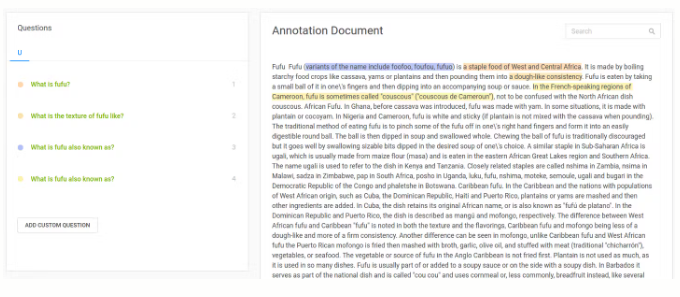




Please use comma separated `CSVs` and include the header in the first line. You might also want to wrap text around quotation marks, e.g. if it contains commas. We always use pandas to_csv method, this should format the file in the right way.

```
docs.csv:
document_identifier,document_text
id1,bbbbb
id2,muh
```
the same holds for the questions.csv:
```
question,document_identifier,question_identifier
question1,id1,qid1
question2,id2,qid2

```


Lets take a subset to test with

### only use rows with URLs

QA_con = QA_large[df['Context_url'].notna()]


In [18]:
QA_con = QA_large[QA_large['Context_url'].notna()]

In [23]:
QA_con.head()

,Questions,Answers,Context_url
0,"We provide you a variety of support related videos on our DELL EMC Support YouTube channel. We publish at least one new video every week so make sure you subscribe and stay up to date with the latest turoials, tipps and tricks about server, storage and networking. Here are some playlist you might find helpful for your daily business regarding DELL EMC Enterprise hardware.OpenManage Server Administrator RAID - Tutorials, Information and Troubleshooting Dell EMC QuickTips - something about everything iDRAC - Setup, Configuration, Troubleshooting Dell Lifecycle Controller SupportAssist Enterprise Virtual Edition You can find the full list here. Something is missing? Got a topic we should cover in one of our videos? Feel free to suggest new topics and give us feedback to existing ones in this thread.","Hi All,there are 2 new videos up on the channel. As always a Quick Tip Video on Service Tag locations and in addition we show you how to install OMSA on ESXi 6.7And don't forget to like the videos and subscribe to our channel for all the latest updates!",
1,"Hello,We were asked by DELL supporter to update iDRAC again for a hardware support, from 6.02.00.00 to 6.10.00.00. After updating, the secure web access to iDRAC failed with error:Bad RequestYour browser sent a request that this server could not understand.Additionally, a 400 Bad Request error was encountered while trying to use an ErrorDocument to handle the request.After doing some tests, I have the following conclusions/workarounds:1. the secure web access failed when using the FQDN of iDRAC interface2. using the IP or short hostname works with the secure web access3. setting iDRAC.WebServer.ManualDNSEntry to have the FQDN included won't solve the issue4. disabling idrac.webserver.HostHeaderCheck aslo works, but could not open virtual console viewer I tried to use racadm command 'sslresetcfg' to regenerate the certificate, but only short hostname used as Common Name (CN) and also only the short hostname listed in the DNS alternative name. By the way, we have DNS BMC/RAC Name and DNS Domain name correctly configured.It looks like to me a new bug in version 6.10.00.00. Though there are not issues with the IP and short hostname access, it is still annoying since we have FQDN defined and linked everywhere. Thanks,Di.","Indeed, this seems fixed in later version. I just updated one of our nodes to version 6.10.80.00, the issue described in my first post has gone. When I was testing iDRAC version 6.10.30.00, the issue was sill there.",
2,"After a long power outage, the accountant decided to turn on the server on her own.After pressing the button ""i"" and holding it for a little longer, she reset the settings iDRAC along with the license.How can I restore it now? The server was purchased in 2014. Service Tag <Service Tag was removed>. .","Hi, Sergei 66, iDRAC license was sent to you. Please ask me if you have any questions, Thank you,Maria JanuszkaDell | Social Outreach Services - EnterpriseMaria JSocial Media and Communities Professional Dell Technologies | Enterprise Support Services #Iwork4Dell Did I answer your query? Please click on ‘Accept as Solution’‘Kudo’ the posts you like!",
3,"Hi Dell Team,We are currently experiencing an issue with the ServiceTag on our Dell server. When attempting to enter the tag on Dell's website, an error message stating ""Service Tag or Product ID Search Error"" is displayed. could you please advise? Best regards!.","It works now, Thank you so much Young E.Have a great day.",
4,"Hello! I want to perform a memory upgrade on my R6515 server.Currently the server has 16x32GB DDR4-2400 RDIMMI bought 16x64GB DDR4-2400 LRDIMM. After the memory upgrade the server only contained these LRDIMM memory modules and nothing was mixed. They were the same brand, speed, type and so just like before.The issue I'm having is that when trying to boot the server with the new memory it doesn't get past the ""Please wait while system is in

### explode any row >1 URL per answer

In [19]:
df_exploded = QA_con.assign(Context_url=QA_large['Context_url'].str.split(',')).explode('Context_url').reset_index(drop=True)


In [20]:
df_exploded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 994 entries, 0 to 993
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Questions    994 non-null    object
 1   Answers      994 non-null    object
 2   Context_url  994 non-null    object
dtypes: object(3)
memory usage: 23.4+ KB


In [21]:
df_exploded.head()

,Questions,Answers,Context_url
0,"We provide you a variety of support related videos on our DELL EMC Support YouTube channel. We publish at least one new video every week so make sure you subscribe and stay up to date with the latest turoials, tipps and tricks about server, storage and networking. Here are some playlist you might find helpful for your daily business regarding DELL EMC Enterprise hardware.OpenManage Server Administrator RAID - Tutorials, Information and Troubleshooting Dell EMC QuickTips - something about everything iDRAC - Setup, Configuration, Troubleshooting Dell Lifecycle Controller SupportAssist Enterprise Virtual Edition You can find the full list here. Something is missing? Got a topic we should cover in one of our videos? Feel free to suggest new topics and give us feedback to existing ones in this thread.","Hi All,there are 2 new videos up on the channel. As always a Quick Tip Video on Service Tag locations and in addition we show you how to install OMSA on ESXi 6.7And don't forget to like the videos and subscribe to our channel for all the latest updates!",
1,"Hello,We were asked by DELL supporter to update iDRAC again for a hardware support, from 6.02.00.00 to 6.10.00.00. After updating, the secure web access to iDRAC failed with error:Bad RequestYour browser sent a request that this server could not understand.Additionally, a 400 Bad Request error was encountered while trying to use an ErrorDocument to handle the request.After doing some tests, I have the following conclusions/workarounds:1. the secure web access failed when using the FQDN of iDRAC interface2. using the IP or short hostname works with the secure web access3. setting iDRAC.WebServer.ManualDNSEntry to have the FQDN included won't solve the issue4. disabling idrac.webserver.HostHeaderCheck aslo works, but could not open virtual console viewer I tried to use racadm command 'sslresetcfg' to regenerate the certificate, but only short hostname used as Common Name (CN) and also only the short hostname listed in the DNS alternative name. By the way, we have DNS BMC/RAC Name and DNS Domain name correctly configured.It looks like to me a new bug in version 6.10.00.00. Though there are not issues with the IP and short hostname access, it is still annoying since we have FQDN defined and linked everywhere. Thanks,Di.","Indeed, this seems fixed in later version. I just updated one of our nodes to version 6.10.80.00, the issue described in my first post has gone. When I was testing iDRAC version 6.10.30.00, the issue was sill there.",
2,"After a long power outage, the accountant decided to turn on the server on her own.After pressing the button ""i"" and holding it for a little longer, she reset the settings iDRAC along with the license.How can I restore it now? The server was purchased in 2014. Service Tag <Service Tag was removed>. .","Hi, Sergei 66, iDRAC license was sent to you. Please ask me if you have any questions, Thank you,Maria JanuszkaDell | Social Outreach Services - EnterpriseMaria JSocial Media and Communities Professional Dell Technologies | Enterprise Support Services #Iwork4Dell Did I answer your query? Please click on ‘Accept as Solution’‘Kudo’ the posts you like!",
3,"Hi Dell Team,We are currently experiencing an issue with the ServiceTag on our Dell server. When attempting to enter the tag on Dell's website, an error message stating ""Service Tag or Product ID Search Error"" is displayed. could you please advise? Best regards!.","It works now, Thank you so much Young E.Have a great day.",
4,"Hello! I want to perform a memory upgrade on my R6515 server.Currently the server has 16x32GB DDR4-2400 RDIMMI bought 16x64GB DDR4-2400 LRDIMM. After the memory upgrade the server only contained these LRDIMM memory modules and nothing was mixed. They were the same brand, speed, type and so just like before.The issue I'm having is that when trying to boot the server with the new memory it doesn't get past the ""Please wait while system is in

### export as csv

In [24]:
df_exploded.to_csv('df_exploded.csv', index=False)

In [22]:
# import

df_exploded = pd.read_csv('df_exploded.csv')

### Context

In [23]:
df_context_temp = df_exploded[df_exploded['Context_url'].str.contains('http://|https://', na=False)]

In [24]:
# remove "tar.gz"
df_filtered = df_context_temp[~df_context_temp['Context_url'].str.contains("tar.gz")]


In [25]:
df_context = df_filtered.reset_index(drop=True) # update index sequence

In [26]:
df_context.head()

,Questions,Answers,Context_url
0,"Hi,Just got R710 and for the life of me, I cannot get it to work or even post. I tried, reset's incl factory and NVRAM, new cmos baterry , memory (switch several DIMM's)...It powers on but dont get VGA (front/back), just LCD messages: ""System is booting..."" or ""ipv6:undefined"" but nothing happens. Just gets stuck. Both power supplies are working, all fans working, idrac also seems to be working and tried ssh ""192.168.0.120"" but nope. Search online and in here but cannot find a solution for this.Honestly, I don't know what to do next.Any ideas would be greatly appreciated. Thanks..","Hello thanks for choosing Dell. Could you try the minimum to post here?https://dell.to/3pDHVh5 Worst case scenario, we should be looking at exchanging motherboards. Wish you a good one.DELL-Young ESocial Media and Communities ProfessionalDell Technologies | Enterprise Support ServicesDid I answer your query? Please click on ‘Accept as Solution’. ‘Kudo’ the posts you like!",https://dell.to/3pDHVh5
1,"Hi,I see on the manual of the T630 server, on the installation guidelines, that each GPU should only support up to 6 GB of memory. So does that mean the server will not fully use the NVIDIA TESLA K80 GPU, which has 12 GB of memory? Does anyone here have experience running GPU on a T-PowerEdge Server?Thank you for any support. It is a very old model from my university lab that I don't know where to seek help...Some further questions...Does the T630 support the TESLA K80 GPU, which has more than 6 GB of memory?There are 4 slots of PCIe x16, will it fully support 4 GPUs? The manual says that installing 2xGPUs has a higher priority than 4xGPUs, does that mean the 3rd and 4th are downclocked?How to check if it even supports GPU? I saw that it needs to be ""GPU-enabled"" or something to run GPUs. I got the tower from my university without any further information...Robin.","Hello, Yes, it is doable. I am currently running 4x K80 in my server, which is essentially an 8x GPU setup. Runs great. You just need to note some parts as you set them up.Power breakout board: I think it is called a ""power distribution"" board, but check the parts for them. That board is located at the bottom of the motherboard. Lift up the MOBO, insert the power board in the extended slot (pretty easy), and insert the MOBO back.Power cable: Pin layout of this power board and the cable is basically an 8x PCIe power layout. PCIe in, PCIe out. (3 yellow power and black ground pairs, with 1 pair of ground). The problem is that, K80 uses a CPU power layout (4 yellow power and black ground pairs). You need an adapter or appropriate cable (Search for PCIe male to CPU or ATX male). We rewired the cables ourselves.https://i.stack.imgur.com/Spsgx.pngFrom the specification of the board, each slot of the power breakout board can carry 300W (standard design is supposed to be 150W instead of 300W, so this is special for the T630), so it has no problem supporting 1 K80 each. So, one PCIe power slot would split into 2 CPU power slots. We have been running it fine for 2 years now, no problem. Be careful to pick a good power cable though. Thing is, you will read online that standard PCIe slots can only support 150W, and when running it, the T630 will give a notification of ""power overloading"". If you want to be safe, you can just do 2x K80.Install a stronger power supply. There are two slots for the PSU, dont care about the 2nd, they dont add to your system. You need a single strong PSU. The second is the spare PSU, which is there to ensure power redundancy.Fan array : With the GPU installed, the server won't run without the fan array (4-fan array in the middle of the chassis). Problem is, these fans are completely useless in cooling down the K80s. Therefore, you can just buy some jumpers or something to bypass it. Or just install the fan array per the requirement.Fan mod: K80s need a fan directly attached on one end of it, being a passive cooling solution. We jus

### True URLs

In [27]:
# Create an empty list to store the true URLs
true_urls = []

# Use tqdm to track the progress
with tqdm(total=len(df_context)) as pbar:
    # Iterate over the URLs in the 'Context_url' column
    for url in df_context['Context_url']:
        try:
            # Send a HEAD request to the URL
            response = requests.head(url)
            
            # Retrieve the true URL from the response headers
            true_url = response.headers.get('Location', url)
            
            # Append the true URL to the list
            true_urls.append(true_url)
        except requests.exceptions.RequestException:
            # Handle any request errors or exceptions
            true_urls.append(None)  # or any desired value to represent an error
        
        # Update the progress bar
        pbar.update(1)

# Add the true URLs as a new column to the DataFrame
df_context['True_URLs'] = true_urls

100%|██████████| 311/311 [05:14<00:00,  1.01s/it]


In [31]:
df_context.head()

,Questions,Answers,Context_url,True_URLs
0,"Hi,Just got R710 and for the life of me, I cannot get it to work or even post. I tried, reset's incl factory and NVRAM, new cmos baterry , memory (switch several DIMM's)...It powers on but dont get VGA (front/back), just LCD messages: ""System is booting..."" or ""ipv6:undefined"" but nothing happens. Just gets stuck. Both power supplies are working, all fans working, idrac also seems to be working and tried ssh ""192.168.0.120"" but nope. Search online and in here but cannot find a solution for this.Honestly, I don't know what to do next.Any ideas would be greatly appreciated. Thanks..","Hello thanks for choosing Dell. Could you try the minimum to post here?https://dell.to/3pDHVh5 Worst case scenario, we should be looking at exchanging motherboards. Wish you a good one.DELL-Young ESocial Media and Communities ProfessionalDell Technologies | Enterprise Support ServicesDid I answer your query? Please click on ‘Accept as Solution’. ‘Kudo’ the posts you like!",https://dell.to/3pDHVh5,https://www.dell.com/community/Systems-Management-General/Dell-PowerEdge-R720-hung-on-post-screen/td-p/4688082?dgc=SM&cid=376139&lid=spr10613228604&refid=sm_LITHIUM_spr10613228604&linkId=223309520
1,"Hi,I see on the manual of the T630 server, on the installation guidelines, that each GPU should only support up to 6 GB of memory. So does that mean the server will not fully use the NVIDIA TESLA K80 GPU, which has 12 GB of memory? Does anyone here have experience running GPU on a T-PowerEdge Server?Thank you for any support. It is a very old model from my university lab that I don't know where to seek help...Some further questions...Does the T630 support the TESLA K80 GPU, which has more than 6 GB of memory?There are 4 slots of PCIe x16, will it fully support 4 GPUs? The manual says that installing 2xGPUs has a higher priority than 4xGPUs, does that mean the 3rd and 4th are downclocked?How to check if it even supports GPU? I saw that it needs to be ""GPU-enabled"" or something to run GPUs. I got the tower from my university without any further information...Robin.","Hello, Yes, it is doable. I am currently running 4x K80 in my server, which is essentially an 8x GPU setup. Runs great. You just need to note some parts as you set them up.Power breakout board: I think it is called a ""power distribution"" board, but check the parts for them. That board is located at the bottom of the motherboard. Lift up the MOBO, insert the power board in the extended slot (pretty easy), and insert the MOBO back.Power cable: Pin layout of this power board and the cable is basically an 8x PCIe power layout. PCIe in, PCIe out. (3 yellow power and black ground pairs, with 1 pair of ground). The problem is that, K80 uses a CPU power layout (4 yellow power and black ground pairs). You need an adapter or appropriate cable (Search for PCIe male to CPU or ATX male). We rewired the cables ourselves.https://i.stack.imgur.com/Spsgx.pngFrom the specification of the board, each slot of the power breakout board can carry 300W (standard design is supposed to be 150W instead of 300W, so this is special for the T630), so it has no problem supporting 1 K80 each. So, one PCIe power slot would split into 2 CPU power slots. We have been running it fine for 2 years now, no problem. Be careful to pick a good power cable though. Thing is, you will read online that standard PCIe slots can only support 150W, and when running it, the T630 will give a notification of ""power overloading"". If you want to be safe, you can just do 2x K80.Install a stronger power supply. There are two slots for the PSU, dont care about the 2nd, they dont add to your system. You need a single strong PSU. The second is the spare PSU, which is there to ensure power redundancy.Fan array : With the GPU installed, the server won't run without the fan array (4-fan array in the middle of the chassis). Problem is, these fans are completely useless in cooling down the K80s. Therefore, y

In [14]:

# Create an empty list to store unique URLs
True_URLs_list = []

# Loop through the "True_URLs" column and extract unique URLs
for url in df_context['True_URLs']:
    if isinstance(url, str):  # Skip NaN values
        True_URLs_list.append(url)

# Remove duplicates by converting the list to a set and then back to a list
True_URLs_list = list(set(True_URLs_list))
.EXE
 https://dl.dell.com/FOLDER06350033M/1/BIOS_94V9N_WN64_2.8.1.EXEFC
# Sort the URLs in alphabetical order
True_URLs_list = sorted(True_URLs_list)

In [15]:
len(True_URLs_list)

241

In [17]:
for i in True_URLs_list:
    print(i)

 https://community.spiceworks.com
 https://dell-eipt-eol.azurewebsites.net/?dgc=SM&cid=376139&lid=spr8347689038&refid=sm_LITHIUM_spr834...
 https://dl.dell.com/FOLDER05944726M/1/Fibre-Channel_Firmware_XHCVJ_WN64_15.05.12_A00-00.EXE
 https://dl.dell.com/FOLDER06350033M/1/BIOS_94V9N_WN64_2.8.1.EXEFC
 https://dl.dell.com/FOLDER06433693M/1/Fibre-Channel_Firmware_M5JNP_WN64_15.15.06_A00-00.EXE
 https://dl.dell.com/FOLDER06548968M/2/BIOS_CFMFX_WN64_2.8.2_01.EXE
 https://dl.dell.com/FOLDER06554252M/1/iDRAC-with-Lifecycle-Controller_Firmware_FP2XW_WN64_4.22.00.53...
 https://github.com/ReFirmLabs/binwalk)
 https://winraid.level1techs.com/t/problem-dell-r720xd-idrac-bios-recovery/32658/95
 https://www.dell.com/support/home/drivers/driversdetails?driverid=9j1m2&oscode=wst14&productcode=pow...#Iwork4Dell
 https://www.dell.com/support/home/en-ht/product-support/product/poweredge-r720xd/drivers
 https://www.dell.com/support/home/en-in/drivers/driversdetails?driverid=yg12x&oscode=w12r2&productco...


In [43]:
df_context.head(20)

,Questions,Answers,Context_url,True_URLs
0,"Hi,Just got R710 and for the life of me, I cannot get it to work or even post. I tried, reset's incl factory and NVRAM, new cmos baterry , memory (switch several DIMM's)...It powers on but dont get VGA (front/back), just LCD messages: ""System is booting..."" or ""ipv6:undefined"" but nothing happens. Just gets stuck. Both power supplies are working, all fans working, idrac also seems to be working and tried ssh ""192.168.0.120"" but nope. Search online and in here but cannot find a solution for this.Honestly, I don't know what to do next.Any ideas would be greatly appreciated. Thanks..","Hello thanks for choosing Dell. Could you try the minimum to post here?https://dell.to/3pDHVh5 Worst case scenario, we should be looking at exchanging motherboards. Wish you a good one.DELL-Young ESocial Media and Communities ProfessionalDell Technologies | Enterprise Support ServicesDid I answer your query? Please click on ‘Accept as Solution’. ‘Kudo’ the posts you like!",https://dell.to/3pDHVh5,https://www.dell.com/community/Systems-Management-General/Dell-PowerEdge-R720-hung-on-post-screen/td-p/4688082?dgc=SM&cid=376139&lid=spr10613228604&refid=sm_LITHIUM_spr10613228604&linkId=223309520
1,"Hi,I see on the manual of the T630 server, on the installation guidelines, that each GPU should only support up to 6 GB of memory. So does that mean the server will not fully use the NVIDIA TESLA K80 GPU, which has 12 GB of memory? Does anyone here have experience running GPU on a T-PowerEdge Server?Thank you for any support. It is a very old model from my university lab that I don't know where to seek help...Some further questions...Does the T630 support the TESLA K80 GPU, which has more than 6 GB of memory?There are 4 slots of PCIe x16, will it fully support 4 GPUs? The manual says that installing 2xGPUs has a higher priority than 4xGPUs, does that mean the 3rd and 4th are downclocked?How to check if it even supports GPU? I saw that it needs to be ""GPU-enabled"" or something to run GPUs. I got the tower from my university without any further information...Robin.","Hello, Yes, it is doable. I am currently running 4x K80 in my server, which is essentially an 8x GPU setup. Runs great. You just need to note some parts as you set them up.Power breakout board: I think it is called a ""power distribution"" board, but check the parts for them. That board is located at the bottom of the motherboard. Lift up the MOBO, insert the power board in the extended slot (pretty easy), and insert the MOBO back.Power cable: Pin layout of this power board and the cable is basically an 8x PCIe power layout. PCIe in, PCIe out. (3 yellow power and black ground pairs, with 1 pair of ground). The problem is that, K80 uses a CPU power layout (4 yellow power and black ground pairs). You need an adapter or appropriate cable (Search for PCIe male to CPU or ATX male). We rewired the cables ourselves.https://i.stack.imgur.com/Spsgx.pngFrom the specification of the board, each slot of the power breakout board can carry 300W (standard design is supposed to be 150W instead of 300W, so this is special for the T630), so it has no problem supporting 1 K80 each. So, one PCIe power slot would split into 2 CPU power slots. We have been running it fine for 2 years now, no problem. Be careful to pick a good power cable though. Thing is, you will read online that standard PCIe slots can only support 150W, and when running it, the T630 will give a notification of ""power overloading"". If you want to be safe, you can just do 2x K80.Install a stronger power supply. There are two slots for the PSU, dont care about the 2nd, they dont add to your system. You need a single strong PSU. The second is the spare PSU, which is there to ensure power redundancy.Fan array : With the GPU installed, the server won't run without the fan array (4-fan array in the middle of the chassis). Problem is, these fans are completely useless in cooling down the K80s. Therefore, y

### clean True URLs

In [47]:
import pandas as pd
import re

# Assuming the original DataFrame is named 'df_context'

# Create a new DataFrame for cleaned data
df_context_cleaned = df_context.copy()

# Convert values in the 'True_URLs' column to strings
df_context_cleaned['True_URLs'] = df_context_cleaned['True_URLs'].astype(str)

# Apply transformations to the 'True_URLs' column
df_context_cleaned = df_context_cleaned[~df_context_cleaned['True_URLs'].str.contains('exe', na=False)]
df_context_cleaned = df_context_cleaned[~df_context_cleaned['True_URLs'].str.contains('youtube', na=False)]
df_context_cleaned = df_context_cleaned[~df_context_cleaned['True_URLs'].str.contains('youtu', na=False)]
df_context_cleaned = df_context_cleaned[~df_context_cleaned['True_URLs'].str.contains('.png', na=False)]
df_context_cleaned = df_context_cleaned[~df_context_cleaned['True_URLs'].str.contains('https://www.dell.com/community/', na=False)]
df_context_cleaned['True_URLs'] = df_context_cleaned['True_URLs'].apply(lambda url: re.sub(r'\.\.\..*', '...', url))

# Label URLs based on specific conditions
df_context_cleaned['Label'] = ''
df_context_cleaned.loc[df_context_cleaned['True_URLs'].str.contains('pdf', na=False), 'Label'] = 'PDF'
df_context_cleaned.loc[df_context_cleaned['True_URLs'].str.contains(' drivers|driver', na=False), 'Label'] = 'Driver'
df_context_cleaned.loc[df_context_cleaned['True_URLs'].str.contains('manuals', na=False), 'Label'] = 'Manual'
df_context_cleaned.loc[df_context_cleaned['True_URLs'].str.contains('kbdoc', na=False), 'Label'] = 'KB'

# Reset the index of the cleaned DataFrame
df_context_cleaned.reset_index(drop=True, inplace=True)

# Print the cleaned DataFrame
print(df_context_cleaned)


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [48]:
df_context_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 287 entries, 0 to 286
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Questions    287 non-null    object
 1   Answers      287 non-null    object
 2   Context_url  287 non-null    object
 3   True_URLs    287 non-null    object
 4   Label        287 non-null    object
dtypes: object(5)
memory usage: 11.3+ KB


In [49]:
df_context_cleaned.head(20)

,Questions,Answers,Context_url,True_URLs,Label
0,"HelloI got Dell PowerEdge T320 8x3.5"", seems that all working as intended but some points don't let me sleep well:1. My server is OEM, how i can turn it to normal one so in IDRAC i will see server model ? as i googled i find that it was possible but for other server model https://www.dell.com/community/PowerEdge-Hardware-General/R710-BIOS-rev-and-model-information-missin...2. In Lifecycle Controller i missing one menu item - Configure RAID and Deploy OS, there only gear icon and then blank space, how i can get all menu items ?[images with personal information removed by Moderator]Bios and other stuff was upgraded to latest versions .",So I've never done this on the T320 specifically but I've done this on other models of this generation.You will want to download this and extract the .pm file from the .exe that will be downloaded.https://www.dell.com/support/home/en-us/drivers/driversdetails?driverid=dgpgh&oscode=ws8r2&productco...Once you have the .pm file downloaded you will log into the idrac web gui and go to the update section and direct it to the .pm file. Once done go to the job queue and wait for the job to complete.Then go to the diagnostics tab within the idrac and press the reset to default settings button and let that complete. Once that reset has completed after a few minutes go to the server itself and do a complete reboot and it should go into a rebranding process after the POST process completes and it will reboot after. After the reboot you should start seeing Dell logos and everything should be more or less back to stock Dell.,https://www.dell.com/support/home/en-us/drivers/driversdetails?driverid=dgpgh&oscode=ws8r2&productco...Once,https://www.dell.com/support/home/en-us/drivers/driversdetails?driverid=dgpgh&oscode=ws8r2&productco...,Driver
1,I have to upgrade a customer's Dell Power Edge T20:Do you have experiences / recommendations for a 1 TB NVMe?The server description states: T20 has two network ports: I find only one:Do I have to enable the second one in BIOS (the server currently is not at my place)?Do you have experiences / recommendations for asecond network card?Many thanks - Michael.,"Hi, i see only 1 here https://dell.to/46iQaQj PCIe SSDs are not validated on the T20. You may be able to get it to work, but it would not be supported. You may not be able to select the PCIe SSD as a boot device. Network cards that was tested by community: Intel X540-T1, 1x 10GBase-T, PCIe 2.1 x8, low profile, retail (X540T1) - QIntel X540-T2, 2x 10GBase-T, PCIe 2.1 x8, low profile, retail (X540T2) - QIntel 10 Gigabit AT2, 1x 10GBase-T, PCIe x8, low profile (E10G41AT2) - QIntel Gigabit CT Desktop Adapter, 1x 1000Base-T, PCIe x1 (EXPI9301CTBLK) - QIBM Intel PRO/1000 PT Gigabit Dual Port 39Y6128 oder die HP NC360T (ist baugleich)Gigabyte GC-WB867D-I, PCIe x1 (Intel AC 7260 plus Bluetooth mit PCIe Adapter) - QIntel Wireless-AC 7260 + Bluetooth Rev.2, PCIe x1 (7260HMWDTX1.R) - QHP NC364T, 4x 1000Base-T, PCIe x4 (435508-B21) (ist baugleich mit Intel PRO/1000 PT, 4x 1000Base-T) - QIntel I350-T4 retail, 4x 1000Base-T, PCIe 2.0 x4 (I350T4) - QTP-Link TL-WN851ND, PCI - Q *WLAN*TP-Link TL-WN881ND, PCIe x1 - Q *WLAN*IBM 49Y4242 NIC (Intel i340-T4 82580 Chip) - QD-Link DXE-820T, 2x 10GBase-T, PCIe 2.0 x8, low profile - QEmulex OneConnect 2x 10GBase-T, PCIe 2.0 x4 (OCe140102-NT) - QFujitsu QuadPort Server Adapter 4x 1GBase-T, PCIe 2.0 x4 (D2745-A11) - QINTEL Ethernet Server Adapter I350-T4V2, 4x 1000Base-T, PCIe 2.0 x4 (I350T4BLKV2)Do you have any further questions?Regards MartinDid I answer your query? Please click on ‘Accept as Solution’. ‘Kudo’ the posts you like!Martin SchiemenzSocial Media and Communities Professional Dell Technologies | Enterprise Support Services",https://dell.to/46iQaQj,https://www.dell.com/support/manuals/en-us/poweredge-t20/t20ownersmanual/back-panel-features-and-indicators?guid=guid-56e0feff-623a-4ab7-9b8d-8af8a3edcca8&lang=en-us&dgc=SM&cid=376139&lid=spr

In [50]:
pdf_count = df_context_cleaned[df_context_cleaned['Label'] == 'PDF'].shape[0]
print("Count of 'PDF' labels:", pdf_count)


Count of 'PDF' labels: 29


### 404 Label check

In [51]:
import pandas as pd
import requests

# Assuming the existing DataFrame is named 'df_context_cleaned'
# Create a new DataFrame for the updated results
df_context_cleaned_v2 = df_context_cleaned.copy()

# Define a function to check if a URL returns a 404 error
def check_404(url):
    try:
        response = requests.get(url)
        return response.status_code == 404
    except requests.exceptions.RequestException:
        return False

# Apply the 404 check to each URL in the 'True_URLs' column
df_context_cleaned_v2['Label'] = df_context_cleaned_v2['True_URLs'].apply(lambda url: '404' if check_404(url) else '')

# Print the updated DataFrame
print(df_context_cleaned_v2)


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [53]:



pdf_count_404 = df_context_cleaned[df_context_cleaned_v2['Label'] == '404'].shape[0]
print("Count of '404' labels:", pdf_count_404)



Count of '404' labels: 29


In [54]:
df_cleaned_v3 = df_context_cleaned_v2[df_context_cleaned_v2['Label'] != '404'].copy()

# Reset the index of the cleaned DataFrame
df_cleaned_v3.reset_index(drop=True, inplace=True)


In [55]:
df_cleaned_v3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 258 entries, 0 to 257
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Questions    258 non-null    object
 1   Answers      258 non-null    object
 2   Context_url  258 non-null    object
 3   True_URLs    258 non-null    object
 4   Label        258 non-null    object
dtypes: object(5)
memory usage: 10.2+ KB


In [67]:
# Create a new DataFrame for cleaned data
df_context_cleaned_v4 = df_cleaned_v3.copy()

# Convert values in the 'True_URLs' column to strings
df_context_cleaned_v4['True_URLs'] = df_context_cleaned_v4['True_URLs'].astype(str)

# Apply transformations to the 'True_URLs' column
df_context_cleaned_v4 = df_context_cleaned_v4[~df_context_cleaned_v4['True_URLs'].str.contains('exe', na=False)]
df_context_cleaned_v4 = df_context_cleaned_v4[~df_context_cleaned_v4['True_URLs'].str.contains('youtube', na=False)]
df_context_cleaned_v4 = df_context_cleaned_v4[~df_context_cleaned_v4['True_URLs'].str.contains('youtu', na=False)]
df_context_cleaned_v4 = df_context_cleaned_v4[~df_context_cleaned_v4['True_URLs'].str.contains('.png', na=False)]
df_context_cleaned_v4 = df_context_cleaned_v4[~df_context_cleaned_v4['True_URLs'].str.contains('https://www.dell.com/community/', na=False)]
df_context_cleaned_v4['True_URLs'] = df_context_cleaned_v4['True_URLs'].apply(lambda url: re.sub(r'\.\.\..*', '...', url))

# Label URLs based on specific conditions
df_context_cleaned_v4['Label'] = ''
df_context_cleaned_v4.loc[df_context_cleaned_v4['True_URLs'].str.contains('pdf', na=False), 'Label'] = 'PDF'
df_context_cleaned_v4.loc[df_context_cleaned_v4['True_URLs'].str.contains(' drivers|driver', na=False), 'Label'] = 'Driver'
df_context_cleaned_v4.loc[df_context_cleaned_v4['True_URLs'].str.contains('manuals', na=False), 'Label'] = 'Manual'
df_context_cleaned_v4.loc[df_context_cleaned_v4['True_URLs'].str.contains('kbdoc', na=False), 'Label'] = 'KB'

# Reset the index of the cleaned DataFrame
df_context_cleaned_v4.reset_index(drop=True, inplace=True)


In [85]:
df_context_cleaned_v4.tail(20)

,Questions,Answers,Context_url,True_URLs,Label
238,"Good day there!We have a few servers of the model mentioned (Dell PowerEdge R520), which were bought in 2012, one in 2014. The question is - could Windows Server of a modern versions (2016, 2019) be successfully installed and run on these platforms? Assuming all the necessary firmware updates are applied already. Are there any issues to await due to the OS is new but the hardware is not that new? And which things are to consider, generally?Thanks in advance,Best regards,Anton G. Ivanov.","Hi Anton, I've checked the downloads and it shows, that actually you can use up to Windows Server 2016 - or better said, we offer drivers for Windows 2016 but not 2019.In theory, it should also work with 2019 but there are no Dell drivers available, so you might encounter minor or major issues.I can't recommend it if you plan to use it in production. But for Windows Server 2016 we have the drivers online: https://www.dell.com/support/home/en-us/product-support/product/poweredge-r520/drivers. As you already mentioned, make sure that the firmware is up to date and then go for it Best regards,StefanStefan RichterCommunity ManagerBrand certified, SMaC Professional",https://www.dell.com/support/home/en-us/product-support/product/poweredge-r520/drivers.,https://www.dell.com/support/home/en-us/product-support/product/poweredge-r520/drivers.,Driver
239,"Dear Experts, Can we install OSMA (OpenManage) on the workstation and manage our servers from our workstation/laptop. I tried to log in but didn't able to log in. May OSMA maybe not work like this, but I didn't not get a satisfactory answer. .","You don't need to ... just connect to OMSA remotely:https://remotehostnameoripaddress:1311 (like https://server:1311 or https://192.168.1.15:1311, etc.) You'll need to make sure any firewalls are set to allow it.",https://remotehostnameoripaddress:1311,None,
240,"Dear Experts, Can we install OSMA (OpenManage) on the workstation and manage our servers from our workstation/laptop. I tried to log in but didn't able to log in. May OSMA maybe not work like this, but I didn't not get a satisfactory answer. .","You don't need to ... just connect to OMSA remotely:https://remotehostnameoripaddress:1311 (like https://server:1311 or https://192.168.1.15:1311, etc.) You'll need to make sure any firewalls are set to allow it.",https://server:1311,None,
241,"Dear Experts, Can we install OSMA (OpenManage) on the workstation and manage our servers from our workstation/laptop. I tried to log in but didn't able to log in. May OSMA maybe not work like this, but I didn't not get a satisfactory answer. .","You don't need to ... just connect to OMSA remotely:https://remotehostnameoripaddress:1311 (like https://server:1311 or https://192.168.1.15:1311, etc.) You'll need to make sure any firewalls are set to allow it.",https://192.168.1.15:1311,None,
242,"Hello,i bought a dell poweredge r610 server. The bios firmware is very old and I get an error when I try to upgrade it. The current version is version 2.1.15. The version I want to upgrade is 6.6.0 version. I tried this on Windows, I ran the 6.6.0 bios update file. After waiting for a while, the warning came that instead of 2.1.15, the 6.6.0 upgrade would be processed and the server would be restarted. I pressed yes and waited for a while, and after waiting a few minutes on the black screen, the update failed. The server continues to boot with 2.1.15 firmware again. I tried this update on linux operating systems but I get the same error. I have been dealing with this problem for 10 days. Please help me to solve this problem. Thank you..","Hello @mcym, The server is really out of date, trying to update it from its current version directly to the latest one can cause issues. When starting firmware version is too old is much better to update step by step. Instead of updating from a very old to the latest firmware version. Check the downloads site and look for the oldest bios version a

In [62]:

count_url = df_context_cleaned_v4[df_context_cleaned_v4['True_URLs'] == "http://www.dell.com"].shape[0]
print("Count of 'http://www.dell.com' URLS:", count_url)

Count of 'http://www.dell.com' URLS: 60


### export

In [81]:
# Assuming the DataFrame to export is named 'df_context_cleaned_v4'
df_context_cleaned_v4.to_csv('df_context_cleaned_v4.csv', index=False)


### Manual, Driver, KB scraping test

In [70]:
df_test = df_context_cleaned_v4.head(10).copy()

In [71]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Questions    10 non-null     object
 1   Answers      10 non-null     object
 2   Context_url  10 non-null     object
 3   True_URLs    10 non-null     object
 4   Label        10 non-null     object
dtypes: object(5)
memory usage: 528.0+ bytes


In [79]:
#test
# Create a function to fetch the text from a given URL
def fetch_text(url):
    try:
        response = requests.get(url)
        response.raise_for_status()  # Raise an exception for non-successful status codes
        
        # Parse the HTML content and extract the text
        soup = BeautifulSoup(response.content, 'html.parser')
        text = soup.get_text(separator=' ')
        
        # Remove newline characters and extra spaces
        text = text.replace('\n', ' ').strip()
        text = ' '.join(text.split())
        
        return text
    except requests.exceptions.RequestException as e:
        print(f"Error fetching URL: {url}")
        print(f"Error message: {str(e)}")
        return ''

# Apply the fetch_text function to each URL in the DataFrame and store the result in a new column called 'Context'
tqdm.pandas()  # Enable progress_apply with tqdm
df_test['Context'] = df_test['Context_url'].progress_apply(fetch_text)



100%|██████████| 10/10 [00:11<00:00,  1.18s/it]


In [73]:
df_test.head(10)

Questions  \
0  HelloI got Dell PowerEdge T320 8x3.5", seems that all working as intended but some points don't let me sleep well:1. My server is OEM, how i can turn it to normal one so in IDRAC i will see server model ? as i googled i find that it was possible but for other server model https://www.dell.com/community/PowerEdge-Hardware-General/R710-BIOS-rev-and-model-information-missin...2. In Lifecycle Controller i missing one menu item - Configure RAID and Deploy OS, there only gear icon and then blank space, how i can get all menu items ?[images with personal information removed by Moderator]Bios and other stuff was upgraded to latest versions .   
1                                                                                                                                                                                                                                                                                              I have to upgrade a customer's Dell Power Edge T20:Do you have experiences / recommendations for a 1 TB NVMe?The server description states: T20 has two network ports: I find only one:Do I have to enable the second one in BIOS (the server currently is not at my place)?Do you have experiences / recommendations for asecond network card?Many thanks - Michael.   
2                                                                                                                                                                                                                                                           I have a R640 here [personal information removed by Mod] with this network card and are looking for latest drivers & firmware due to bonding issue with Debian Bookworm.iDrac reports it as "QLogic 577xx/578xx 10 Gb Ethernet BCM57800"lspci reports it as"Broadcom Inc. and subsidiaries NetXtreme II BCM57800 1/10 Gigabit Ethernet (rev 10)"It has 2 x 10Gb eth ports & 2 x 1Gb eth portsThanksDave.   
3                                                                                                                                                                                                                                                          Hi guys,I have T410 with iDRAC6 with firmware 1.90 (Build 09). The server has ESXi 5.5.The current firmware doesn't support TLS 1.2 and I'm trying to upgrade it to a version with TLS 1.2.When searching versions on Dell I see:- Versions for different OS. Which one do I need? I thought iDRAC firmware is OS agnostic.- Also there is "iDRAC Monolithic Release". Is it a different version? Thanks.   
4                                                                               I have a T150 that came with 16GB RAM, I purchased 128GB 4x32GB DDR4-3200 PC4-25600 2Rx8 ECC Unbuffered Server Memory from Amazon and I'm able to add two sticks in slots A1&A3 and it's boots up fine and shows 64GB RAM, but when I add the other two sticks to slots A2&A4 the server won't boot, it gets stuck on "Loading BIOS Drivers".  Now I can leave the two sticks in slots A1&A3, then add the original 16GB stick to slot A2 and it works (totaling 80GB RAM).  I tried resetting the BIOS using the jumper but still can't get it to boot when I have 4x32 populated..   
5                                                                                                                                                                                                                                                                                                                                                                                                                                                        I search for a NIC like Dell Intel X550-T2 (https://www.dell.com/de-de/shop/dell-intel-x550-t2-dual-port-10-gigabit-netzwerkkarte-kupfer/apd/540...) for PowerEdge R740 or works this NIC also? Thank You!.   
6       Hi,I haven't used my PowerEdge T620 in a year or so. When I just turned it ON, it says:Conf

In [80]:
# Display the head of the DataFrame when the Label is 'KB'
if 'KB' in df_test['Label'].values:
    kb_rows = df_test[df_test['Label'] == 'KB']
    print(kb_rows.head())

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 Questions  \
8  Greetings!I am adding 16TB x 1 SATA HDD hot-plug hard disk to add more storage in our Dell PowerEdge T440 Server, that currently has RAID-1 (446GB x 2 SATA SSD) and RAID-5 (3725GB x 4 SATA HDD).  The added new HDD is in the current state Ready (not Online).  Question:  What is the best way to add this additional hard disk?  Can I add this to the existing RAID-5?  Or, will it be better to create a new Virtual Disk?  I am

In [83]:
# Display the head of the DataFrame when the Label is 'KB'
if 'PDF' in df_test['Label'].values:
    kb_rows = df_test[df_test['Label'] == 'PDF']
    print(kb_rows.head())

In [87]:

# Create a function to fetch the text from a given URL
def fetch_text(url):
    try:
        response = requests.get(url)
        response.raise_for_status()  # Raise an exception for non-successful status codes
        
        # Parse the HTML content and extract the text
        soup = BeautifulSoup(response.content, 'html.parser')
        text = soup.get_text(separator=' ')
        
        # Remove newline characters and extra spaces
        text = text.replace('\n', ' ').strip()
        text = ' '.join(text.split())
        
        return text
    except requests.exceptions.RequestException as e:
        print(f"Error fetching URL: {url}")
        print(f"Error message: {str(e)}")
        return ''

# Apply the fetch_text function to each URL in the DataFrame and store the result in a new column called 'Context'
tqdm.pandas()  # Enable progress_apply with tqdm
df_context_cleaned_v4['Context'] = df_context_cleaned_v4['Context_url'].progress_apply(fetch_text)



  7%|▋         | 18/258 [00:34<05:36,  1.40s/it]

Error fetching URL: https://kb.vmware.com/s/article/1007036Dell
Error message: 403 Client Error: Forbidden for url: https://kb.vmware.com/s/article/1007036Dell


 12%|█▏        | 32/258 [04:12<1:39:57, 26.54s/it]

Error fetching URL:  https://www.rapidtables.com/convert/number/decimal-to-hex.html?x=75
Error message: 403 Client Error: Forbidden for url: https://www.rapidtables.com/convert/number/decimal-to-hex.html?x=75


 18%|█▊        | 47/258 [04:36<07:05,  2.01s/it]

Error fetching URL: https://www.dell.com/support/manuals/en-us/poweredge-r420/r420ownersmanual-v2/technical-specificatio...https://www.dell.com/support/manuals/en-us/poweredge-r520/r520systemsownersmanual/technical-specific...Thanks
Error message: 404 Client Error: Not Found for url: https://www.dell.com/support/manuals/en-us/poweredge-r420/r420ownersmanual-v2/technical-specificatio...https://www.dell.com/support/manuals/en-us/poweredge-r520/r520systemsownersmanual/technical-specific...Thanks


 29%|██▉       | 76/258 [15:27<19:51,  6.55s/it]

Error fetching URL: https://dell.to/3TlBIQk
Error message: 403 Client Error: Forbidden for url: https://kb.vmware.com/s/article/71367?linkId=185953550


 33%|███▎      | 84/258 [16:09<15:10,  5.23s/it]

Error fetching URL: https://www.dell.com/support/manuals/en-us/poweredge-fc630/fc630ownersmanual/system-board-jumper-set...https://www.dell.com/support/manuals/en-us/poweredge-fc630/fc630ownersmanual/disabling-a-forgotten-p...
Error message: 404 Client Error: Not Found for url: https://www.dell.com/support/manuals/en-us/poweredge-fc630/fc630ownersmanual/system-board-jumper-set...https://www.dell.com/support/manuals/en-us/poweredge-fc630/fc630ownersmanual/disabling-a-forgotten-p...


 55%|█████▌    | 142/258 [1:38:01<14:40:15, 455.30s/it]

Error fetching URL: https://www.dell.com/support/manuals/en-us/poweredge-r720/720720xdom/general-memory-module-installat...https://www.dell.com/support/manuals/en-us/poweredge-r720/720720xdom/system-memory?guid=guid-7550b0f...
Error message: 404 Client Error: Not Found for url: https://www.dell.com/support/manuals/en-us/poweredge-r720/720720xdom/general-memory-module-installat...https://www.dell.com/support/manuals/en-us/poweredge-r720/720720xdom/system-memory?guid=guid-7550b0f...


 63%|██████▎   | 162/258 [1:45:07<1:02:40, 39.17s/it] 

Error fetching URL: https://docs.vmware.com/en/VMware-vSphere/7.0/com.vmware.vsphere.security.doc/GUID-94F0C54F-05E3-4E1...Once
Error message: 403 Client Error: Forbidden for url: https://docs.vmware.com/en/VMware-vSphere/7.0/com.vmware.vsphere.security.doc/GUID-94F0C54F-05E3-4E1...Once


 67%|██████▋   | 172/258 [2:07:50<1:40:56, 70.43s/it]  

Error fetching URL: https://<hostname>/login.html"
Error message: HTTPSConnectionPool(host='%3chostname%3e', port=443): Max retries exceeded with url: /login.html%22 (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7f7eb2740340>: Failed to establish a new connection: [Errno -2] Name or service not known'))
Error fetching URL:  https://<hostname>/start.html".Thanks
Error message: HTTPSConnectionPool(host='%3chostname%3e', port=443): Max retries exceeded with url: /start.html%22.Thanks (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7f7eb2743c70>: Failed to establish a new connection: [Errno -2] Name or service not known'))


 72%|███████▏  | 186/258 [2:15:15<21:02, 17.54s/it]  

Error fetching URL: https://<iDRAC
Error message: HTTPSConnectionPool(host='%3cidrac', port=443): Max retries exceeded with url: / (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7f7eb31481c0>: Failed to establish a new connection: [Errno -2] Name or service not known'))


 91%|█████████ | 234/258 [3:08:26<15:23, 38.48s/it]   

Error fetching URL: https://dell.to/3l0UjAs
Error message: 500 Server Error: Internal Server Error for url: https://ecauk.com/files/2016/07/Dell-PowerEdge-M1000e-Blade-Enclosure-Owners-Manual.pdf?linkId=97552980


 93%|█████████▎| 241/258 [3:20:06<20:14, 71.47s/it] 

Error fetching URL: https://remotehostnameoripaddress:1311
Error message: HTTPSConnectionPool(host='remotehostnameoripaddress', port=1311): Max retries exceeded with url: / (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7f7eb3149b70>: Failed to establish a new connection: [Errno -3] Temporary failure in name resolution'))


 94%|█████████▍| 242/258 [3:20:16<14:08, 53.03s/it]

Error fetching URL:  https://server:1311
Error message: HTTPSConnectionPool(host='server', port=1311): Max retries exceeded with url: / (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7f7eb3148eb0>: Failed to establish a new connection: [Errno -3] Temporary failure in name resolution'))


 94%|█████████▍| 243/258 [3:22:25<18:59, 75.95s/it]

Error fetching URL:  https://192.168.1.15:1311
Error message: HTTPSConnectionPool(host='192.168.1.15', port=1311): Max retries exceeded with url: / (Caused by ConnectTimeoutError(<urllib3.connection.HTTPSConnection object at 0x7f7eb3149b70>, 'Connection to 192.168.1.15 timed out. (connect timeout=None)'))


 97%|█████████▋| 249/258 [3:22:32<01:28,  9.84s/it]

Error fetching URL: https://lemire.me/blog/2018/09/07/avx-512-when-and-how-to-use-these-new-instructions/
Error message: 403 Client Error: Forbidden for url: https://lemire.me/blog/2018/09/07/avx-512-when-and-how-to-use-these-new-instructions/


 97%|█████████▋| 250/258 [3:22:37<01:07,  8.40s/it]

Error fetching URL: https://idrac.local/
Error message: HTTPSConnectionPool(host='idrac.local', port=443): Max retries exceeded with url: / (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7f7eb27424d0>: Failed to establish a new connection: [Errno -2] Name or service not known'))


 97%|█████████▋| 251/258 [3:22:42<00:51,  7.40s/it]

Error fetching URL:  https://idrac.local/
Error message: HTTPSConnectionPool(host='idrac.local', port=443): Max retries exceeded with url: / (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7f7eb3176590>: Failed to establish a new connection: [Errno -2] Name or service not known'))


100%|██████████| 258/258 [3:22:59<00:00, 47.21s/it]


In [88]:
df_context_cleaned_v4.to_csv('cleaned_context_v1.csv', escapechar='\\', index=False)

In [89]:
df_context_cleaned_v4.to_csv('cleaned_context_v2.csv', escapechar='\\', index=False)

In [94]:
df_context_cleaned_v4.head(2)

Questions  \
0  HelloI got Dell PowerEdge T320 8x3.5", seems that all working as intended but some points don't let me sleep well:1. My server is OEM, how i can turn it to normal one so in IDRAC i will see server model ? as i googled i find that it was possible but for other server model https://www.dell.com/community/PowerEdge-Hardware-General/R710-BIOS-rev-and-model-information-missin...2. In Lifecycle Controller i missing one menu item - Configure RAID and Deploy OS, there only gear icon and then blank space, how i can get all menu items ?[images with personal information removed by Moderator]Bios and other stuff was upgraded to latest versions .   
1                                                                                                                                                                                                                                                                                              I have to upgrade a customer's Dell Power Edge T20:Do you have experiences / recommendations for a 1 TB NVMe?The server description states: T20 has two network ports: I find only one:Do I have to enable the second one in BIOS (the server currently is not at my place)?Do you have experiences / recommendations for asecond network card?Many thanks - Michael.   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            Answers  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    So I've never done this on the T320 specifically but I've done this on other models of this generation.You will want to download this and extract the .pm file from the .exe that will be downloaded.https://www.dell.com/support/home/en-us/drivers/driversdetails?driverid=dgpgh&oscode=ws8r2&productco...Once you have the .pm file downloaded you will log into the idrac web gui and go to the update section and direct it to the .pm file. Once

In [91]:
df_context_cleaned_v4_json = df_context_cleaned_v4.to_json(orient='records')


In [96]:
pdf_count = df_context_cleaned_v4[df_context_cleaned_v4['Label'] == 'PDF'].shape[0]
print("Count of 'pdf':", pdf_count)

Count of 'pdf': 27


### pdf 


filtering out 27 PDF

In [97]:
pdf_examples = df_context_cleaned_v4[df_context_cleaned_v4['Label'] == 'PDF'].head(4)
print(pdf_examples)

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [98]:
df_con = df_context_cleaned_v4[df_context_cleaned_v4['Label'] != 'PDF'].copy()


### context length

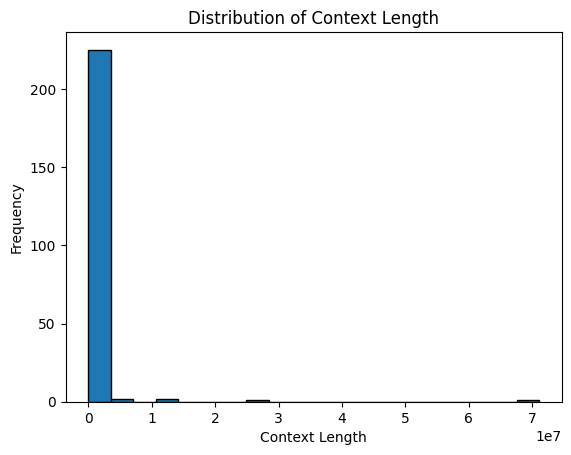

In [112]:
import matplotlib.pyplot as plt

# Plot histogram
plt.hist(df_con['Context_Length'], bins=20, edgecolor='black')
plt.xlabel('Context Length')
plt.ylabel('Frequency')
plt.title('Distribution of Context Length')
plt.show()


In [113]:
import numpy as np

# Count of zeros
zeros_count = np.count_nonzero(df_con['Context_Length'] == 0)

# Mean and median
mean_length = np.mean(df_con['Context_Length'])
median_length = np.median(df_con['Context_Length'])

# Print the statistics
print("Count of zeros:", zeros_count)
print("Mean length:", mean_length)
print("Median length:", median_length)


Count of zeros: 19
Mean length: 616738.2510822511
Median length: 7108.0


### context length and UUID

In [99]:
# Add UUID column
df_con['UUID'] = [uuid.uuid4() for _ in range(len(df_con))]

# Add length column
df_con['Context_Length'] = df_con['Context'].str.len()

In [102]:
df_con.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 231 entries, 0 to 257
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Questions       231 non-null    object
 1   Answers         231 non-null    object
 2   Context_url     231 non-null    object
 3   True_URLs       231 non-null    object
 4   Label           231 non-null    object
 5   Context         231 non-null    object
 6   UUID            231 non-null    object
 7   Context_Length  231 non-null    int64 
dtypes: int64(1), object(7)
memory usage: 16.2+ KB


In [118]:
df_con.to_csv('df_con.csv', index=False, escapechar='\\')



Please use comma separated `CSVs` and include the header in the first line. You might also want to wrap text around quotation marks, e.g. if it contains commas. We always use pandas to_csv method, this should format the file in the right way.

```
docs.csv:

document_identifier,document_text
id1,bbbbb
id2,muh
```
the same holds for the `questions.csv`:
```
question,document_identifier,question_identifier
question1,id1,qid1
question2,id2,qid2

```

quotation marks

In [103]:
df_con['Context'] = '"' + df_con['Context'] + '"'


In [104]:
df_con.iloc[2]

Questions                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               

In [110]:
# Create a new DataFrame with duplicated columns
df_haystack = df_con.copy()
df_haystack['UUID_1'] = df_haystack['UUID']
df_haystack['UUID_2'] = df_haystack['UUID']

# Reset the index of the DataFrame
df_haystack.reset_index(drop=True, inplace=True)


In [9]:
df_og.head()

,Questions,Answers
0,We provide you a variety of support related vi...,"Hi All,there are 2 new videos up on the channe..."
1,"Hello,We were asked by DELL supporter to updat...","Indeed, this seems fixed in later version. I j..."
2,"After a long power outage, the accountant deci...","Hi, Sergei 66, iDRAC license was sent to you. ..."
3,"Hi Dell Team,We are currently experiencing an ...","It works now, Thank you so much Young E.Have a..."
4,Hello! I want to perform a memory upgrade on m...,"SDeltaE, That is the correct dimm, as you can..."


In [114]:
# Rename columns
df_haystack.rename(columns={'UUID_1': 'question_identifier', 'UUID_2': 'document_identifier', 'Context': 'document_text', 'Questions': 'question'}, inplace=True)

# Remove other columns
df_haystack = df_haystack[['question_identifier', 'document_identifier', 'document_text', 'question']]


In [115]:
df_haystack.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231 entries, 0 to 230
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   question_identifier  231 non-null    object
 1   document_identifier  231 non-null    object
 2   document_text        231 non-null    object
 3   question             231 non-null    object
dtypes: object(4)
memory usage: 7.3+ KB


In [116]:
df_haystack.to_csv('df_haystack.csv', index=False, escapechar='\\')



In [117]:
df_haystack.head(2)

question_identifier                   document_identifier  \
0  7ffe65c4-c5a6-4ea8-86a3-fb4c064ac63c  7ffe65c4-c5a6-4ea8-86a3-fb4c064ac63c   
1  786b8a0d-b27d-4dfd-837e-71c3012b51f0  786b8a0d-b27d-4dfd-837e-71c3012b51f0   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

### export x2 csv files for haystack

In [120]:
# Export 'document_identifier' and 'document_text' as 'docs.csv' with escape character set
df_haystack[['document_identifier', 'document_text']].to_csv('docs.csv', index=False, escapechar='\\')

# Export 'question', 'document_identifier', and 'question_identifier' as 'questions.csv' with escape character set
df_haystack[['question', 'document_identifier', 'question_identifier']].to_csv('questions.csv', index=False, escapechar='\\')


issues with above, exporting as `txt`

In [121]:
import os
import pandas as pd

# Assuming your dataframe is named 'df_haystack' and the columns are 'document_identifier' and 'document_text'

# Create a folder to store the text files
folder_path = "Documents_text"
os.makedirs(folder_path, exist_ok=True)

# Iterate over each row in the dataframe
for index, row in df_haystack.iterrows():
    # Get the UUID and corresponding text data
    document_identifier = row['document_identifier']
    text_data = row['document_text']

    # Generate the file name using the UUID and create the file path
    file_name = f"{document_identifier}.txt"
    file_path = os.path.join(folder_path, file_name)

    # Save the text data to the file
    with open(file_path, 'w') as f:
        f.write(text_data)


In [123]:
import os
import pandas as pd

# Assuming your dataframe is named 'df' and the columns are 'question_identifier' and 'questions'

# Create a folder to store the text files
folder_path = "Questions_text"
os.makedirs(folder_path, exist_ok=True)

# Iterate over each row in the dataframe
for index, row in df_haystack.iterrows():
    # Get the UUID and corresponding question text
    question_identifier = row['question_identifier']
    question_text = row['question']

    # Generate the file name using the UUID and create the file path
    file_name = f"{question_identifier}.txt"
    file_path = os.path.join(folder_path, file_name)

    # Save the question text to the file
    with open(file_path, 'w') as f:
        f.write(question_text)

    # Optionally, print the file path for each saved file
    print(f"File saved: {file_path}")


File saved: Questions_text/7ffe65c4-c5a6-4ea8-86a3-fb4c064ac63c.txt
File saved: Questions_text/786b8a0d-b27d-4dfd-837e-71c3012b51f0.txt
File saved: Questions_text/3f573006-1312-4510-91a2-e0be2bbe68eb.txt
File saved: Questions_text/4395f868-29d3-4d53-8166-b8ee5b47d906.txt
File saved: Questions_text/e9bead3f-6b11-4043-b139-415e86c219fd.txt
File saved: Questions_text/b7bb46f5-204e-450e-ab9f-db85c3316efc.txt
File saved: Questions_text/bbfbb8be-b23a-4fab-aa01-b333118c5bec.txt
File saved: Questions_text/c250d41c-1979-4679-974d-61dc63d2ff99.txt
File saved: Questions_text/f88f04ea-044b-41d7-a34c-8b353d803a9a.txt
File saved: Questions_text/909216b5-3152-47c1-a722-179a719d5ebf.txt
File saved: Questions_text/e8128294-9f36-4993-a1d0-db17dfb59157.txt
File saved: Questions_text/8e4e70ab-f77e-4f48-b7d0-8627ac2f31bd.txt
File saved: Questions_text/2f0c23b3-47e5-4c58-8e31-88a097dbeced.txt
File saved: Questions_text/e028d7fb-79c2-4bbb-b56e-94e58ee9c1ec.txt
File saved: Questions_text/664d4d85-b630-4bae-97

# Labelling

In [39]:
# df = pd.read_csv('df_con.csv')


df = pd.read_csv('df_haystack.csv')



In [40]:
df.head()

,question_identifier,document_identifier,document_text,question
0,7ffe65c4-c5a6-4ea8-86a3-fb4c064ac63c,7ffe65c4-c5a6-4ea8-86a3-fb4c064ac63c,"""OEMR PowerEdge T320 Dell Branded Identity Mod...","HelloI got Dell PowerEdge T320 8x3.5"", seems t..."
1,786b8a0d-b27d-4dfd-837e-71c3012b51f0,786b8a0d-b27d-4dfd-837e-71c3012b51f0,"""Dell PowerEdge T20 Owner's Manual | Dell Irel...",I have to upgrade a customer's Dell Power Edge...
2,3f573006-1312-4510-91a2-e0be2bbe68eb,3f573006-1312-4510-91a2-e0be2bbe68eb,"""Dell Firmware Update Package for Marvell Fast...",I have a R640 here [personal information remov...
3,4395f868-29d3-4d53-8166-b8ee5b47d906,4395f868-29d3-4d53-8166-b8ee5b47d906,"""Dell iDRAC Monolithic Release 2.92 | Driver D...","Hi guys,I have T410 with iDRAC6 with firmware ..."
4,e9bead3f-6b11-4043-b139-415e86c219fd,e9bead3f-6b11-4043-b139-415e86c219fd,"""Laptops, Monitors, Computers & Storage Soluti...","I have a T150 that came with 16GB RAM, I purch..."


### improve uuid (skip)

```
import pandas as pd
import re

# Assuming your DataFrame is named "df"

# Function to generate a 7-digit numerical identifier in order
def generate_identifier():
    generate_identifier.counter += 1
    return str(generate_identifier.counter).zfill(7)

# Initialize the counter to 0
generate_identifier.counter = 0

# Function to replace UUIDs with the generated identifier
def replace_uuid(match):
    return generate_identifier()

# Replace the UUIDs in the "question_identifier" column
df['question_identifier'] = df['question_identifier'].apply(lambda x: re.sub(r'[a-fA-F0-9-]+', replace_uuid, x))

# Reset the counter for the "document_identifier" column
generate_identifier.counter = 0

# Replace the UUIDs in the "document_identifier" column
df['document_identifier'] = df['document_identifier'].apply(lambda x: re.sub(r'[a-fA-F0-9-]+', replace_uuid, x))

```


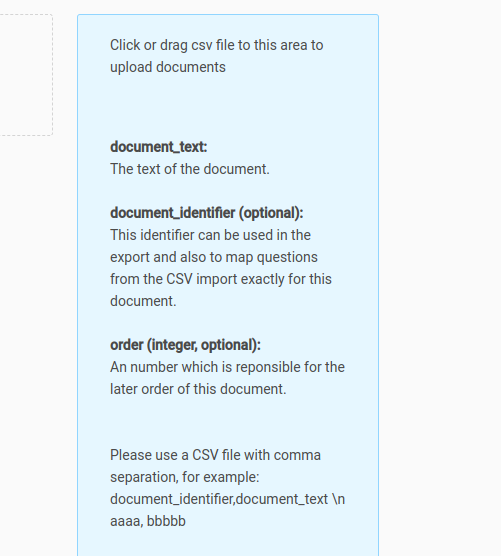

## alpabeticalize questions, then set document order

In [42]:
import pandas as pd

# Assuming your DataFrame is named "df"

# Extract the first word from the 'Questions' column
def extract_first_word(question):
    return question.split()[0]

# Create a new column 'First_Word' with the first word of each question
df['First_Word'] = df['question'].apply(extract_first_word)

# Sort the DataFrame based on the 'First_Word' column in alphabetical order
df_sorted = df.sort_values(by='First_Word')

# Drop the temporary 'First_Word' column
df_sorted.drop(columns='First_Word', inplace=True)

# Reset the index to create a new 'order' column
df_sorted.reset_index(drop=True, inplace=True)

# Create the new 'order' column with the new index
df_sorted['order'] = df_sorted.index

In [43]:
df_sorted.head()

,question_identifier,document_identifier,document_text,question,order
0,f265ba3c-9527-45dc-a9f4-897ac5c04770,f265ba3c-9527-45dc-a9f4-897ac5c04770,"""Laptops, Monitors, Computers & Storage Soluti...",A 4-server VRTX was shipped to us that already...,0
1,902b7939-e8c5-440b-b2bd-0cacae35f070,902b7939-e8c5-440b-b2bd-0cacae35f070,"""Laptops, Monitors, Computers & Storage Soluti...",A 4-server VRTX was shipped to us that already...,1
2,7a26218f-a017-4549-ae19-0462b2ace989,7a26218f-a017-4549-ae19-0462b2ace989,"""Dell EMC Boot Optimized Server Storage-S1 Use...",BI see this forum post here which suggests cer...,2
3,db3d73a9-ccf8-443a-bd20-8e8f1e67970d,db3d73a9-ccf8-443a-bd20-8e8f1e67970d,"""Servers - Rack, Tower & Rugged Servers | Dell...",Can anyone tell me the End Of Sale For the Pow...,3
4,14310625-82d0-43ea-9008-3d478a30113a,14310625-82d0-43ea-9008-3d478a30113a,"""Support for PowerEdge R930 | Overview | Dell ...",Can anyone suggest which Internal Dual SD Modu...,4


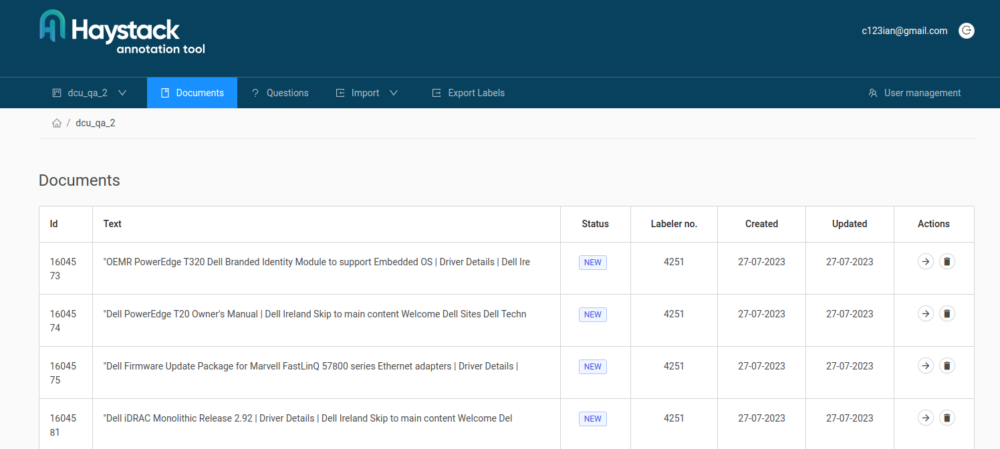

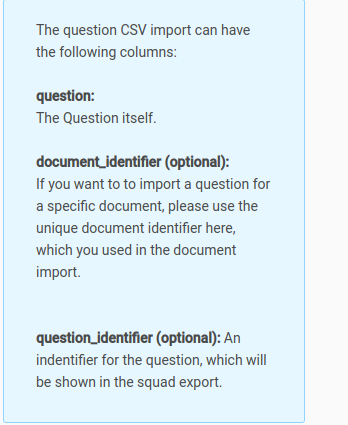

Question appear alphabetical 

In [45]:

# Export 'document_text', 'document_identifier', and 'order' columns to "doc_Aug.csv"
df_doc_aug = df_sorted[['document_text', 'document_identifier', 'order']].copy()
df_doc_aug.to_csv('doc_Aug.csv', index=False)

# Export 'question' and 'question_identifier' columns to "q_Aug.csv"
df_q_aug = df_sorted[['question', 'question_identifier']].copy()
df_q_aug.to_csv('q_Aug.csv', index=False)


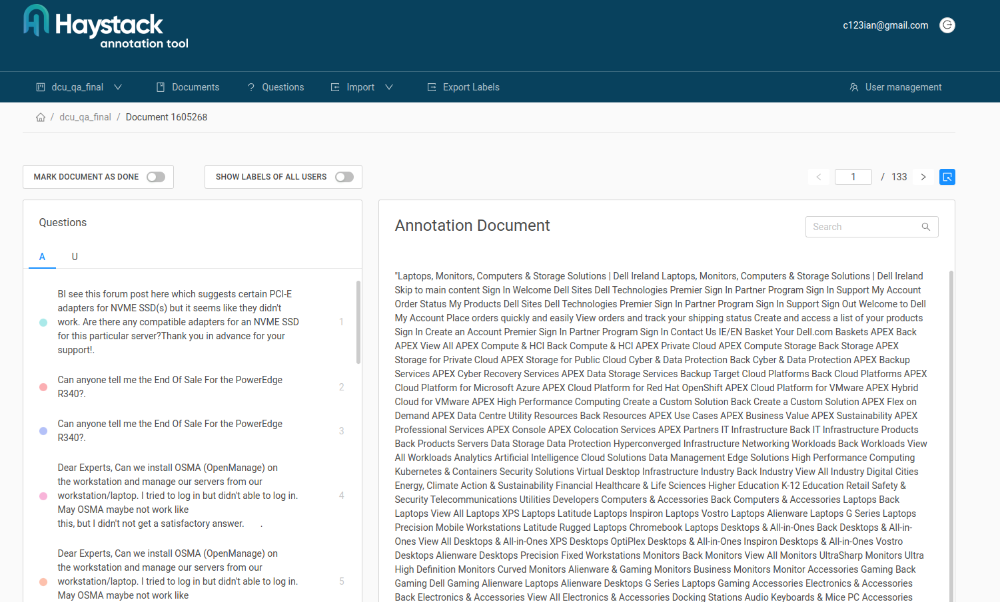

In [46]:
print(df_sorted[['document_text', 'question']].head())

                                       document_text  \
0  "Laptops, Monitors, Computers & Storage Soluti...   
1  "Laptops, Monitors, Computers & Storage Soluti...   
2  "Dell EMC Boot Optimized Server Storage-S1 Use...   
3  "Servers - Rack, Tower & Rugged Servers | Dell...   
4  "Support for PowerEdge R930 | Overview | Dell ...   

                                            question  
0  A 4-server VRTX was shipped to us that already...  
1  A 4-server VRTX was shipped to us that already...  
2  BI see this forum post here which suggests cer...  
3  Can anyone tell me the End Of Sale For the Pow...  
4  Can anyone suggest which Internal Dual SD Modu...  


In [132]:
df_sorted.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231 entries, 0 to 230
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   question_identifier  231 non-null    object
 1   document_identifier  231 non-null    object
 2   document_text        231 non-null    object
 3   question             231 non-null    object
 4   order                231 non-null    int64 
dtypes: int64(1), object(4)
memory usage: 9.1+ KB


In [134]:
df_sorted['question'].to_csv('questions_only.csv', index=False)


In [139]:
# Get the total number of rows in the DataFrame for tqdm
folder_name = 'Documents_only'

total_rows = len(df_sorted)

# Iterate through the DataFrame rows and create text files with tqdm
for index, row in tqdm(df_sorted.iterrows(), total=total_rows, desc='Creating text files'):
    question_words = row['question'].split()[:3]  # Get the first 3 words from the question
    file_name = "_".join(question_words) + ".txt"  # Join the words and create the file name
    document_text = row['document_text']  # Get the 'document_text' for the current row

    # Write the 'document_text' to the text file
    with open(os.path.join(folder_name, file_name), 'w') as file:
        file.write(document_text)

Creating text files: 100%|██████████| 231/231 [00:00<00:00, 1775.64it/s]


### remember, question duplicated if more than one document was referenced in the forum answers

- To assist with annotating the document, lets have answers and context url on hand

In [124]:
df_cleaning = pd.read_csv('df_con.csv')


In [125]:
# Counting occurrences of 'PDF' and 'NaN' in the 'Label' column
pdf_count = df_cleaning['Label'].value_counts().get('PDF', 0)
man_count = df_cleaning['Label'].value_counts().get('Manual', 0)
nan_count = df_cleaning['Label'].isnull().sum()

# Counting occurrences of 0 in the 'Context_Length' column
count_zero_context_length = df_helper['Context_Length'].value_counts().get(0, 0)

print("Count of 'Context_Length' values equal to 0:", count_zero_context_length)

print("Count of 'PDF':", pdf_count)
print("Count of 'Manual':", man_count)
print("Count of 'NaN':", nan_count)

Count of 'Context_Length' values equal to 0: 19
Count of 'PDF': 0
Count of 'Manual': 61
Count of 'NaN': 117


In [166]:
df_cleaning.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231 entries, 0 to 230
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Questions       231 non-null    object
 1   Answers         231 non-null    object
 2   Context_url     231 non-null    object
 3   True_URLs       231 non-null    object
 4   Label           114 non-null    object
 5   Context         231 non-null    object
 6   UUID            231 non-null    object
 7   Context_Length  231 non-null    int64 
dtypes: int64(1), object(7)
memory usage: 14.6+ KB


In [131]:
df_cleaning.head(1)

Questions  \
0  HelloI got Dell PowerEdge T320 8x3.5", seems that all working as intended but some points don't let me sleep well:1. My server is OEM, how i can turn it to normal one so in IDRAC i will see server model ? as i googled i find that it was possible but for other server model https://www.dell.com/community/PowerEdge-Hardware-General/R710-BIOS-rev-and-model-information-missin...2. In Lifecycle Controller i missing one menu item - Configure RAID and Deploy OS, there only gear icon and then blank space, how i can get all menu items ?[images with personal information removed by Moderator]Bios and other stuff was upgraded to latest versions .   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          Answers  \
0  So I've never done this on the T320 specifically but I've done this on other models of this generation.You will want to download this and extract the .pm file from the .exe that will be downloaded.https://www.dell.com/support/home/en-us/drivers/driversdetails?driverid=dgpgh&oscode=ws8r2&productco...Once you have the .pm file downloaded you will log into the idrac web gui and go to the update section and direct it to the .pm file. Once done go to the job queue and wait for the job to complete.Then go to the diagnostics tab within the idrac and press the reset to default settings button and let that complete.  Once that reset has completed after a few minutes go to the server itself and do a complete reboot and it should go into a rebranding process after the POST process completes and it will reboot after. After the reboot you should start seeing Dell logos and everything should be more or less back to stock Dell.   

                                                                                                   Context_url  \
0  https://www.dell.com/support/home/en-us/drivers/driversdetails?driverid=dgpgh&oscode=ws8r2&productco...Once   

                                                                                                 True_URLs  \
0  https://www.dell.com/support/home/en-us/drivers/driversdetails?driverid=dgpgh&oscode=ws8r2&productco...   

    Label  \
0  Driver   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  

---------------------------------------------

# Importing df_help, this is a little messy beware


df_help = pd.read_csv('df_con.csv')

In [167]:
df_help = pd.read_csv('df_con.csv')

In [173]:
df_help.reset_index(drop=True, inplace=True)


In [174]:
df_help.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231 entries, 0 to 230
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Questions       231 non-null    object
 1   Answers         231 non-null    object
 2   Context_url     231 non-null    object
 3   True_URLs       231 non-null    object
 4   Label           114 non-null    object
 5   Context         231 non-null    object
 6   UUID            231 non-null    object
 7   Context_Length  231 non-null    int64 
dtypes: int64(1), object(7)
memory usage: 14.6+ KB


In [175]:
# For example, you might have read it from a CSV file or created it programmatically

# Filter out rows where 'Label' is 'NaN'
df_cleaning = df_help[df_help['Label'].notna()][['Questions', 'Answers', 'True_URLs', 'document_text', 'Label']].copy()

# Define the function to extract the first word from the 'Questions' column
def extract_first_word(question):
    return question.split()[0]

# Add a new column 'First_Word' with the first word of each question
df_cleaning['First_Word'] = df_cleaning['Questions'].apply(extract_first_word)

# Sort the DataFrame based on the 'First_Word' column in alphabetical order
df_cleaning = df_cleaning.sort_values(by='First_Word')

# Drop the temporary 'First_Word' column
df_cleaning.drop(columns='First_Word', inplace=True)

# Reset the index with a new order and create the 'Order' column
df_cleaning.reset_index(drop=True, inplace=True)
df_cleaning['Order'] = df_cleaning.index + 1

# Add 'document_identifier' and 'question_identifier' columns with simple 4-digit UUIDs
df_cleaning['document_identifier'] = [str(uuid.uuid4().int)[:4] for _ in range(len(df_cleaning))]
df_cleaning['question_identifier'] = [str(uuid.uuid4().int)[:4] for _ in range(len(df_cleaning))]



KeyError: "['document_text'] not in index"

In [113]:
df_help.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 107 entries, 0 to 106
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   question             107 non-null    object
 1   Answers              107 non-null    object
 2   True_URLs            107 non-null    object
 3   document_text        107 non-null    object
 4   document_text        107 non-null    object
 5   Label                107 non-null    object
 6   Order                107 non-null    int64 
 7   document_identifier  107 non-null    object
 8   question_identifier  107 non-null    object
dtypes: int64(1), object(8)
memory usage: 7.6+ KB


- only `133` documents upload sucessfully (context len >0, not labelled NaN (no url))
- will adjust df_help to reflect this

In [141]:
df_help.head(100)

,question,Answers,True_URLs,document_text,document_text,Label,Order,document_identifier,question_identifier
0,BI see this forum post here which suggests certain PCI-E adapters for NVME SSD(s) but it seems like they didn't work. Are there any compatible adapters for an NVME SSD for this particular server?Thank you in advance for your support!.,"Hi,The BOSS card mentioned in that thread should work, however it only supports a few SSDs. https://dell.to/3cvyGq5 Thanks,DELL-Josh CrSocial Media and Communities ProfessionalDell Technologies | Enterprise Support ServicesDid I answer your query? Please click on ‘Accept as Solution’. ‘Kudo’ the posts you like!",https://www.dell.com/support/manuals/en-us/boss-s-1/boss_s1_ug_publication/supported-m.2-drives?guid=guid-5290f1c0-5362-4598-aa08-64782b796910&lang=en-us&dgc=SM&cid=376139&lid=spr4664548091&RefID=dtw21_spr4664548091&linkId=114671637,"""Dell EMC Boot Optimized Serve","""Dell EMC Boot Optimized Serve",Manual,1,1149,8314
1,"Currently we're using Dell PowerEdge T640 Server with Processor(s) Intel Xeon Silver 4210 2.2G, 10C/20Twith 2x 16GB SKhynix 16GB 2Rx8 PC4 - 2666v-re2-12(HMA82GR7JJR8N-VK TF AC) Memory on it and 1 of the memory just crush down.So i decided to purchase 1 replacement for that memory and our supplier offer me this MemoryDell 16GB 3200 MT/s MemoryKingston KTD-PE426D8/16G Memory Which 1 of this memory is suitable for my server and does this memory can work together with our 1 remaining SKhynix 16GB 2Rx8 PC4 memory?Please if anyone can help me with thisBelow are links for memory specs:SKhynix 16GB 2Rx8 PC4 - 2666v -https://memory.net/product/hma82gr7jjr8n-vk-sk-hynix-1x-16gb-ddr4-2666-rdimm-pc4-21300v-r-dual-rank-....Kingston KTD-PE426D8/16G Memory https://www.kingstonmemoryshop.co.uk/kingston-dell-ktd-pe426d8-16g-16gb-ddr4-2666mt-s-ecc-registered....Dell 16GB 3200 MT/s Memoryhttps://www.dell.com/en-us/work/shop/dell-memory-upgrade-16gb-2rx8-ddr4-rdimm-3200mhz/apd/aa783421/m....PS This discussion was created because of my wrong posts last time..","Copying response send on original post. T640 support 2666 speed memory. T640 does not support 3200 MT/s memory.As you pointed out Kingston KTD-PE426D8/16G looks like have same specification of current one. Looks like this one is not from Dell. In most of the cases we seen memory with same specification works but we can not guarantee that non Dell memory will work as it is not validated.. You can refer below link for more details on memory supported on T640https://www.dell.com/support/manuals/en-us/poweredge-t640/pet640_ism_pub/system-memory-guidelines?gu...https://www.dell.com/support/manuals/en-us/poweredge-t640/pet640_ism_pub/general-memory-module-insta... Thanks,DELL-Shine K",https://www.dell.com/support/manuals/en-us/poweredge-t640/pet640_ism_pub/system-memory-guidelines?gu...,"""Dell Technologies PowerEdge T","""Dell Technologies PowerEdge T",Manual,2,2115,7868
2,"Dear all, I'm facing a problem with one of the CPUs of our PowerEdge 520.From IDRAC I got the following error: A bus fatal error was detected on a component at bus 64 device 3 function 0. The hardware inventory points out to: IDRAC version: 2.60.60.60Bios version: 2.1.2 From the system reboot, I got: AHCI bios not installed, which doesn't allow me to type F2, F10, F11, or F12. Regards..","Hello TeslaTec, Has any hardware been added or removed, or firmware updated, when this occurred?In the iDRAC where you see the bus fatal error; Is there an entry near it that indicates a slot number? Initial troubleshooting steps I can recommend:*Flea power drain, test results*Clear NVRAM, test results*Minimum to POST configuration testing drain flea power (shut down, disconnect power cables and Network cables, hold in power button 20 seconds with cords removed). After flea power drain, system has to set for 3 minutes for DRAC to reset without any power plugged in, then plug in NIC and power but wait 2 minutes before power on to give DRAC time to initialize. Clear NVRAM - there

# 255 question char limit! cause of most issuess..


In [144]:

# Count the number of rows where the 'question' column has >= 255 characters
num_rows_with_255_or_more_chars = df_help[df_help['question'].str.len() >= 255].shape[0]

# Print the result
print(f"Number of rows with >= 255 characters in the 'question' column: {num_rows_with_255_or_more_chars}")


Number of rows with >= 255 characters in the 'question' column: 85


### Summarize long questions?

In [163]:
from summa.summarizer import summarize

In [164]:

# Create a new column 'question_len' to store the character counts in the 'question' column
df_help['question_len'] = df_help['question'].str.len()

In [165]:
df_help.head()

,question,Answers,True_URLs,document_text,document_text,Label,Order,document_identifier,question_identifier,question_len
0,BI see this forum post here which suggests certain PCI-E adapters for NVME SSD(s) but it seems like they didn't work. Are there any compatible adapters for an NVME SSD for this particular server?Thank you in advance for your support!.,"Hi,The BOSS card mentioned in that thread should work, however it only supports a few SSDs. https://dell.to/3cvyGq5 Thanks,DELL-Josh CrSocial Media and Communities ProfessionalDell Technologies | Enterprise Support ServicesDid I answer your query? Please click on ‘Accept as Solution’. ‘Kudo’ the posts you like!",https://www.dell.com/support/manuals/en-us/boss-s-1/boss_s1_ug_publication/supported-m.2-drives?guid=guid-5290f1c0-5362-4598-aa08-64782b796910&lang=en-us&dgc=SM&cid=376139&lid=spr4664548091&RefID=dtw21_spr4664548091&linkId=114671637,"""Dell EMC Boot Optimized Serve","""Dell EMC Boot Optimized Serve",Manual,1,1149,8314,234
1,,"Copying response send on original post. T640 support 2666 speed memory. T640 does not support 3200 MT/s memory.As you pointed out Kingston KTD-PE426D8/16G looks like have same specification of current one. Looks like this one is not from Dell. In most of the cases we seen memory with same specification works but we can not guarantee that non Dell memory will work as it is not validated.. You can refer below link for more details on memory supported on T640https://www.dell.com/support/manuals/en-us/poweredge-t640/pet640_ism_pub/system-memory-guidelines?gu...https://www.dell.com/support/manuals/en-us/poweredge-t640/pet640_ism_pub/general-memory-module-insta... Thanks,DELL-Shine K",https://www.dell.com/support/manuals/en-us/poweredge-t640/pet640_ism_pub/system-memory-guidelines?gu...,"""Dell Technologies PowerEdge T","""Dell Technologies PowerEdge T",Manual,2,2115,7868,0
2,"Dear all, I'm facing a problem with one of the CPUs of our PowerEdge 520.From IDRAC I got the following error: A bus fatal error was detected on a component at bus 64 device 3 function 0.\nThe hardware inventory points out to: IDRAC version: 2.60.60.60Bios version: 2.1.2 From the system reboot, I got: AHCI bios not installed, which doesn't allow me to type F2, F10, F11, or F12.\nRegards..","Hello TeslaTec, Has any hardware been added or removed, or firmware updated, when this occurred?In the iDRAC where you see the bus fatal error; Is there an entry near it that indicates a slot number? Initial troubleshooting steps I can recommend:*Flea power drain, test results*Clear NVRAM, test results*Minimum to POST configuration testing drain flea power (shut down, disconnect power cables and Network cables, hold in power button 20 seconds with cords removed). After flea power drain, system has to set for 3 minutes for DRAC to reset without any power plugged in, then plug in NIC and power but wait 2 minutes before power on to give DRAC time to initialize. Clear NVRAM - there is a map under the lid to show the jumper location. Shut down, Set jumper to the Clear position, power on and Post up to the jumper error, shut down and return to original location. Minimum to post (this is minimum components to POST, it won't boot, this is to test POST. If successful POST, put things back a little at a time until find faulting component) The minimum components to allow the Dell PowerEdge R520 to complete POST are as follows: *System Board*CPU1 with heat sink (if no POST try with other CPU in CPU1 socket)*Single DIMM configuration with DIMM in socket A1 (if no POST try a different DIMM in A1)*Control Panel with cable*Expansion Riser*PSU (and for redundant PSU also the PDB/PIB) Remove anything not on that list: DVD, Hard drives, PERC controller, backplane, network card, NIC cable, any pcie cards, keyboard, mouse, USB devices, …. anything not on the list remove. If it does not post then the issue is with one of those components.If you get successful POST, put things back a little at a time until you find

In [ ]:
# Export 'document_text', 'document_identifier', and 'order' columns to "doc_Aug.csv"
df_doc_aug = df_sorted[['document_text', 'document_identifier', 'order']].copy()
df_doc_aug.to_csv('doc_Aug.csv', index=False)

# Export 'question' and 'question_identifier' columns to "q_Aug.csv"
df_q_aug = df_sorted[['question', 'question_identifier']].copy()
df_q_aug.to_csv('q_Aug.csv', index=False)


In [182]:
df_d = pd.read_csv('docs.csv')


In [183]:
df_d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231 entries, 0 to 230
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   document_identifier  231 non-null    object
 1   document_text        231 non-null    object
dtypes: object(2)
memory usage: 3.7+ KB


In [176]:
df_q = pd.read_csv('questions_only.csv')


In [180]:
df_q.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231 entries, 0 to 230
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   question  231 non-null    object
dtypes: object(1)
memory usage: 1.9+ KB


In [179]:
df_q.head(30)

,question
0,A 4-server VRTX was shipped to us that already was functioning properly in another facility. I am new to servers so not sure where to begin with understanding how to use it. I plugged in three network cables into it and it seemed to acquite a public IP address. I can log in to the chasis management console with this IP address from my laptop.I can see the four server have been assigned some local IP address like 192.168.0.121 . But obviously those aren't accessible from our network. How can I get the individual servers assigned a public IP address like the Chasis got?.
1,A 4-server VRTX was shipped to us that already was functioning properly in another facility. I am new to servers so not sure where to begin with understanding how to use it. I plugged in three network cables into it and it seemed to acquite a public IP address. I can log in to the chasis management console with this IP address from my laptop.I can see the four server have been assigned some local IP address like 192.168.0.121 . But obviously those aren't accessible from our network. How can I get the individual servers assigned a public IP address like the Chasis got?.
2,BI see this forum post here which suggests certain PCI-E adapters for NVME SSD(s) but it seems like they didn't work. Are there any compatible adapters for an NVME SSD for this particular server?Thank you in advance for your support!.
3,Can anyone tell me the End Of Sale For the PowerEdge R340?.
4,"Can anyone suggest which Internal Dual SD Module is compatible with 13th generation server PowerEdge R930? I have one additional constraint, because after watching installation videos published by Dell, it seems that the Internal Dual SD Module must be installed on an existing PERC H730P PCIe card. I think that the Internal Dual SD Module shown in the video may only be compatible with 12th generation servers, but I am not sure. Thank you in advance for your time and consideration.."
5,Can anyone tell me the End Of Sale For the PowerEdge R340?.
6,"Currently we're using Dell PowerEdge T640 Server with Processor(s) Intel Xeon Silver 4210 2.2G, 10C/20Twith 2x 16GB SKhynix 16GB 2Rx8 PC4 - 2666v-re2-12(HMA82GR7JJR8N-VK TF AC) Memory on it and 1 of the memory just crush down.So i decided to purchase 1 replacement for that memory and our supplier offer me this MemoryDell 16GB 3200 MT/s MemoryKingston KTD-PE426D8/16G Memory Which 1 of this memory is suitable for my server and does this memory can work together with our 1 remaining SKhynix 16GB 2Rx8 PC4 memory?Please if anyone can help me with thisBelow are links for memory specs:SKhynix 16GB 2Rx8 PC4 - 2666v -https://memory.net/product/hma82gr7jjr8n-vk-sk-hynix-1x-16gb-ddr4-2666-rdimm-pc4-21300v-r-dual-rank-....Kingston KTD-PE426D8/16G Memory https://www.kingstonmemoryshop.co.uk/kingston-dell-ktd-pe426d8-16g-16gb-ddr4-2666mt-s-ecc-registered....Dell 16GB 3200 MT/s Memoryhttps://www.dell.com/en-us/work/shop/dell-memory-upgrade-16gb-2rx8-ddr4-rdimm-3200mhz/apd/aa783421/m....PS This discussion was created because of my wrong posts last time.."
7,"Dear Experts, Can we install OSMA (OpenManage) on the workstation and manage our servers from our workstation/laptop. I tried to log in but didn't able to log in. May OSMA maybe not work like this, but I didn't not get a satisfactory answer. ."
8,"Dear Experts, Can we install OSMA (OpenManage) on the workstation and manage our servers from our workstation/laptop. I tried to log in but didn't able to log in. May OSMA maybe not work like this, but I didn't not get a satisfactory answer. ."
9,"Dear Experts, Can we install OSMA (OpenManage) on the workstation and manage our servers from our workstation/laptop. I tried to log in but didn't able to log in. May OSMA maybe not work like this, but I didn't not get a satisfactory answer. ."


In [186]:
# Truncate the 'question' column to 255 characters or less
df_q['question'] = df_q['question'].str[:255]

# If the original 'question' column contains leading or trailing whitespaces, you may want to remove them as well:
df_q['question'] = df_q['question'].str.strip()

df_q.to_csv('question_trunc.csv', index=False)


In [187]:
df_q.head()

,question
0,A 4-server VRTX was shipped to us that already was functioning properly in another facility. I am new to servers so not sure where to begin with understanding how to use it. I plugged in three network cables into it and it seemed to acquite a public IP ad
1,A 4-server VRTX was shipped to us that already was functioning properly in another facility. I am new to servers so not sure where to begin with understanding how to use it. I plugged in three network cables into it and it seemed to acquite a public IP ad
2,BI see this forum post here which suggests certain PCI-E adapters for NVME SSD(s) but it seems like they didn't work. Are there any compatible adapters for an NVME SSD for this particular server?Thank you in advance for your support!.
3,Can anyone tell me the End Of Sale For the PowerEdge R340?.
4,"Can anyone suggest which Internal Dual SD Module is compatible with 13th generation server PowerEdge R930? I have one additional constraint, because after watching installation videos published by Dell, it seems that the Internal Dual SD Module must be in"


In [190]:
# Add the 'order' column to df_d
df_d['order'] = range(1, len(df_d) + 1)

# Rearrange the columns to contain only 'document_text' and 'order'
df_d2 = df_d[['document_text', 'order']]

In [191]:
df_d2.head()

document_text  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             "OEMR PowerEdge T320 Dell Branded Identity Module to support Embedded OS | Driver Details | Dell Ireland Skip to main content Welcome Dell Sites Dell Technologies Premier Sign In Partner Program Sign In Support Dell Sites Dell Technologies Premier Sign In Partner Program Sign In Support Sign Out Welcome to Dell My Account Place orders quickly and easily View orders and track your shipping status Create and access a list of your products Manage your Dell EMC sites, products, and product-level contacts using Company Administration. Sign In Create an Account Premier Sign In Partner Program Sign In Contact Us IE/EN Basket Your Dell.com Baskets Products Solutions Services Support Back Support Support Home Support Library Support Services & Warranty Drivers & Downloads Manuals & Documentation Diagnostics & Tools Self-Repair & Parts Service Requests & Dispatch Status Order Support Contact Support Community Contact Us IE/EN Back Support Product Support Driver Details OEMR PowerEdge T320 Dell Branded Identity Module to support Embedded OS Restart required AUTO INSTALLED This file was automatically installed as part of a recent update. If you are experiencing any issues, you can manually download and reinstall. This file was automatically installed as part of a recent update. If you are experiencing any issues, you can manually download and reinstall. DBE version of PowerEdge T320 ID Module to support SLP 2.3. D

In [192]:

df_d2.to_csv('documents_only.csv', index=False)

# 'index=False' ensures that the index column is not saved in the CSV file.


In [193]:
df_q.head(231)

,question
0,A 4-server VRTX was shipped to us that already was functioning properly in another facility. I am new to servers so not sure where to begin with understanding how to use it. I plugged in three network cables into it and it seemed to acquite a public IP ad
1,A 4-server VRTX was shipped to us that already was functioning properly in another facility. I am new to servers so not sure where to begin with understanding how to use it. I plugged in three network cables into it and it seemed to acquite a public IP ad
2,BI see this forum post here which suggests certain PCI-E adapters for NVME SSD(s) but it seems like they didn't work. Are there any compatible adapters for an NVME SSD for this particular server?Thank you in advance for your support!.
3,Can anyone tell me the End Of Sale For the PowerEdge R340?.
4,"Can anyone suggest which Internal Dual SD Module is compatible with 13th generation server PowerEdge R930? I have one additional constraint, because after watching installation videos published by Dell, it seems that the Internal Dual SD Module must be in"
5,Can anyone tell me the End Of Sale For the PowerEdge R340?.
6,"Currently we're using Dell PowerEdge T640 Server with Processor(s) Intel Xeon Silver 4210 2.2G, 10C/20Twith 2x 16GB SKhynix 16GB 2Rx8 PC4 - 2666v-re2-12(HMA82GR7JJR8N-VK TF AC) Memory on it and 1 of the memory just crush down.So i decided to purchase 1 re"
7,"Dear Experts, Can we install OSMA (OpenManage) on the workstation and manage our servers from our workstation/laptop. I tried to log in but didn't able to log in. May OSMA maybe not work like this, but I didn't not get a satisfactory answer. ."
8,"Dear Experts, Can we install OSMA (OpenManage) on the workstation and manage our servers from our workstation/laptop. I tried to log in but didn't able to log in. May OSMA maybe not work like this, but I didn't not get a satisfactory answer. ."
9,"Dear Experts, Can we install OSMA (OpenManage) on the workstation and manage our servers from our workstation/laptop. I tried to log in but didn't able to log in. May OSMA maybe not work like this, but I didn't not get a satisfactory answer. ."


In [ ]:
df.to_csv('documents_only.csv', index=False)


In [195]:

# Select the 'question' column from df_q
questions = df_q['question']

# Select the 'document_text' and 'order' columns from df_d2
documents = df_d2[['document_text', 'order']]

# Combine the two selected columns into a new DataFrame df_combo
df_combo = pd.concat([questions, documents], axis=1)

In [196]:
df_combo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231 entries, 0 to 230
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   question       231 non-null    object
 1   document_text  231 non-null    object
 2   order          231 non-null    int64 
dtypes: int64(1), object(2)
memory usage: 5.5+ KB


In [198]:
df_a = pd.read_csv('df_con.csv')
df_a.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231 entries, 0 to 230
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Questions       231 non-null    object
 1   Answers         231 non-null    object
 2   Context_url     231 non-null    object
 3   True_URLs       231 non-null    object
 4   Label           114 non-null    object
 5   Context         231 non-null    object
 6   UUID            231 non-null    object
 7   Context_Length  231 non-null    int64 
dtypes: int64(1), object(7)
memory usage: 14.6+ KB


In [206]:
# Extract the first word from each question and create a new column 'First_Word'
df_a['First_Word'] = df_a['Questions'].str.split().str[0]

# Sort the DataFrame based on the 'First_Word' column
df_a.sort_values(by='First_Word', inplace=True)

# Reset the index after sorting
df_a.reset_index(drop=True, inplace=True)

# Create a new column 'Order' containing the order of the sorted questions
df_a['order'] = range(1, len(df_a) + 1)

# Now, df_a contains the 'Questions' column sorted alphabetically based on the first word that occurs,
# and a new 'Order' column has been created.

In [207]:
df_a.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231 entries, 0 to 230
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Questions       231 non-null    object
 1   Answers         231 non-null    object
 2   Context_url     231 non-null    object
 3   True_URLs       231 non-null    object
 4   Label           114 non-null    object
 5   Context         231 non-null    object
 6   UUID            231 non-null    object
 7   Context_Length  231 non-null    int64 
 8   First_Word      231 non-null    object
 9   Order           231 non-null    int64 
 10  order           231 non-null    int64 
dtypes: int64(3), object(8)
memory usage: 20.0+ KB


In [208]:
# Merge df_a['Answers'] into df_combo using the 'order' column as the key
df_combo = df_combo.merge(df_a[['order', 'Answers']], on='order', how='left')


In [210]:
# Create a new DataFrame df_combo_2 by copying the relevant columns from df_combo
df_combo_2 = df_combo[['question', 'document_text', 'order', 'Answers']].copy()

# Retain only the first 50 characters from the 'document_text' column
df_combo_2['document_text'] = df_combo_2['document_text'].str[:50]


In [212]:
df_combo_2.head(100)

,question,document_text,order,Answers
0,A 4-server VRTX was shipped to us that already was functioning properly in another facility. I am new to servers so not sure where to begin with understanding how to use it. I plugged in three network cables into it and it seemed to acquite a public IP ad,"""OEMR PowerEdge T320 Dell Branded Identity Module",1,"Hello thisisalloneword, While you have access with a static IP make sure the CMC firmware is up to date.Dell Chassis Management Controller (CMC) for Dell PowerEdge VRTX, Version 3.40https://dell.to/3g1DAwbDownload CMC_VRTX_3.40_A00.exe, execute to extract file. Supply the vrtx_cmc_3.40.bin file.Page 9 installation procedure - https://dell.to/2Xv3BOd Then if you want, you can reset CMC to defaults and try the Initial Setup again. You can SSH or Console connect to the CMC and resets CMC configuration to factory default settings with command line command:racadm racresetcfg Use something like putty to SSH to the CMC IP and run the command or Install a NULL modem cable between the DB-9 serial connector on the CMC and a client machine.Accessing the CLI using DB-9 Serial Port :Open a terminal emulator of your choice (such as HyperTerminal or Minicom) and use the following set up:8 bitsNo parityNo flow controlBaud rate = 115200Type the username at the login prompt, and type the password at the Password prompt. Then, press <Enter>. Default is user: root, password: calvin You may want to review this video: Inside the Lab: Dennis and Lance Setup their VRTX for the first time.https://dell.to/3CEkpCe3:30 time mark for initial setup. -Dell PowerEdge VRTX Enclosure Owner's Manual - page 28 Initial setup Sequence : https://dell.to/3fZkExW Dell -Charles RSocial Media and Communities ProfessionalDell Technologies | Enterprise Support ServicesDid I answer your query? Please click on ‘Accept as Solution’. ‘Kudo’ the posts you like!"
1,A 4-server VRTX was shipped to us that already was functioning properly in another facility. I am new to servers so not sure where to begin with understanding how to use it. I plugged in three network cables into it and it seemed to acquite a public IP ad,"""Dell PowerEdge T20 Owner's Manual | Dell Ireland",2,"Hello thisisalloneword, While you have access with a static IP make sure the CMC firmware is up to date.Dell Chassis Management Controller (CMC) for Dell PowerEdge VRTX, Version 3.40https://dell.to/3g1DAwbDownload CMC_VRTX_3.40_A00.exe, execute to extract file. Supply the vrtx_cmc_3.40.bin file.Page 9 installation procedure - https://dell.to/2Xv3BOd Then if you want, you can reset CMC to defaults and try the Initial Setup again. You can SSH or Console connect to the CMC and resets CMC configuration to factory default settings with command line command:racadm racresetcfg Use something like putty to SSH to the CMC IP and run the command or Install a NULL modem cable between the DB-9 serial connector on the CMC and a client machine.Accessing the CLI using DB-9 Serial Port :Open a terminal emulator of your choice (such as HyperTerminal or Minicom) and use the following set up:8 bitsNo parityNo flow controlBaud rate = 115200Type the username at the login prompt, and type the password at the Password prompt. Then, press <Enter>. Default is user: root, password: calvin You may want to review this video: Inside the Lab: Dennis and Lance Setup their VRTX for the first time.https://dell.to/3CEkpCe3:30 time mark for initial setup. -Dell PowerEdge VRTX Enclosure Owner's Manual - page 28 Initial setup Sequence : https://dell.to/3fZkExW Dell -Charles RSocial Media and Communities ProfessionalDell Technologies | Enterprise Support ServicesDid I answer your query? Please click on ‘Accept as Solution’. ‘Kudo’ the posts you like!"
2,BI see this forum post here which suggests certain PCI-E adapters for NVME SSD(s) but it seems like they didn't work. Are there any compatible adapters for an NVME SSD for this particular server?Thank you in advance for your support!.,"""Dell Firmware Up

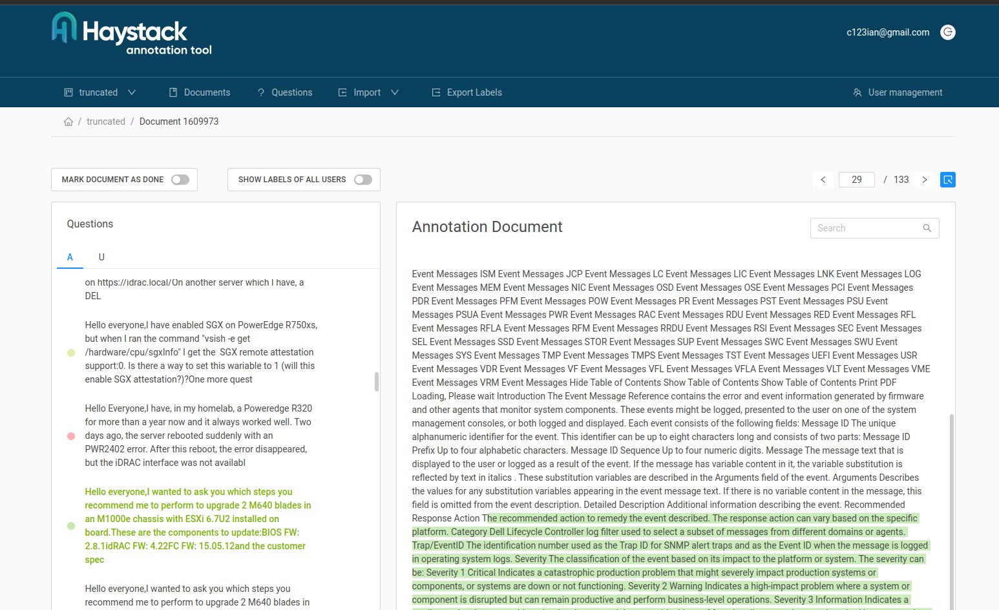

In [4]:
df_og = pd.read_csv("QA_large_cleaned.csv")

In [5]:
df_og.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1901 entries, 0 to 1900
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Questions  1901 non-null   object
 1   Answers    1901 non-null   object
dtypes: object(2)
memory usage: 29.8+ KB


In [6]:
df_og.head()

,Questions,Answers
0,We provide you a variety of support related vi...,"Hi All,\nthere are 2 new videos up on the chan..."
1,"Hello,We were asked by DELL supporter to updat...","Indeed, this seems fixed in later version. I j..."
2,"After a long power outage, the accountant deci...","Hi, Sergei 66,\n \niDRAC license was sent to y..."
3,"Hi Dell Team,We are currently experiencing an ...","It works now, Thank you so much Young E.Have a..."
4,Hello! I want to perform a memory upgrade on m...,"SDeltaE,\n \n \nThat is the correct dimm, as y..."


In [7]:
df_og = df_og.replace('\n','', regex=True)
df_og = df_og.replace('\n\n','', regex=True)

In [8]:
df_og.head()

,Questions,Answers
0,We provide you a variety of support related vi...,"Hi All,there are 2 new videos up on the channe..."
1,"Hello,We were asked by DELL supporter to updat...","Indeed, this seems fixed in later version. I j..."
2,"After a long power outage, the accountant deci...","Hi, Sergei 66, iDRAC license was sent to you. ..."
3,"Hi Dell Team,We are currently experiencing an ...","It works now, Thank you so much Young E.Have a..."
4,Hello! I want to perform a memory upgrade on m...,"SDeltaE, That is the correct dimm, as you can..."


In [10]:
# haystack format prep

df_og = df_og.rename(columns={'Questions': 'question', 'Answers': 'document_text'})

# Step 2: Organize 'question' rows in alphabetical order
df_og = df_og.sort_values('question')

# Step 3: Add an 'order' column with the row order
df_og = df_og.reset_index(drop=True)  # Reset index first without keeping old
df_og['order'] = df_og.index  # Add order column

# Step 4: Add a 'document_identifier' column using 'order' numbers
df_og['document_identifier'] = 'doc_' + df_og['order'].astype(str)

In [11]:
df_og.head()

,question,document_text,order,document_identifier
0,###Server Model firmware###Poweredge M630 Powe...,With VRTX system in order for ESXi to recogniz...,0,doc_0
1,(hope i'm posting at the correct location)Hi g...,iDRAC will apply the firmware correctly to res...,1,doc_1
2,*** all!I have some Dell PowerEdge R420 server...,"Hello.Unfortunately, we are not able to open t...",2,doc_2
3,---This is my very first Server project. I am ...,"Thank you for the service tag.You are correct,...",3,doc_3
4,A 4-server VRTX was shipped to us that already...,"Hello thisisalloneword, While you have access ...",4,doc_4


In [13]:
print(df_og.iloc[100])

question               Dear experts:Our iDrac 6 temperature warning t...
document_text          Mrclinker27,You would have to use the IPMI too...
order                                                                100
document_identifier                                              doc_100
Name: 100, dtype: object


In [55]:

import pandas as pd

# Assuming df_og is your original DataFrame

# Take the first 1000 rows of the DataFrame
df_og = df_og.iloc[:1000]

# Step 1: Remove specific substrings from all columns
df_og_replaced = df_og.replace(['\t', 'Solved!', 'Go to Solution.'], ['', '', ''], regex=True)

# Step 2: Trim 'question' column if longer than 255 characters
df_og_trimmed = df_og_replaced.copy()
df_og_trimmed['question'] = df_og_replaced['question'].apply(lambda x: x[:255] if len(x) > 255 else x)

# Step 3: Export 'question' and 'document_identifier' columns to q_pair_docid.csv
df_q_export = df_og_trimmed[['question', 'document_identifier']]
df_q_export.to_csv('q_pair_docid_subset.csv', index=False)

# Step 4: Export 'document_text', 'document_identifier', and 'order' columns to d_pair_docid.csv
df_d_export = df_og_trimmed[['document_text', 'document_identifier', 'order']]
df_d_export.to_csv('d_pair_docid_subset.csv', index=False)


In [49]:
df_q_export.head()

,question,document_identifier
0,"###Server Model firmware###Poweredge M630 PowerEdge VRTX CMC firmware version 2.21###Config###Seven SAS HDDs configured as one virtual drive. Screenshot: PHY,VIRTUAL###Issue###SAS HDDs not recognized by Esxi 6.5 Only local disk appears in Storage of Esxi",doc_0
1,"(hope i'm posting at the correct location)Hi guys,i got some PowerEdge R740 servers waiting for firmware update. My current firmware version is quite old, about 2 years ago.The components on these R740 are:(got from iDRAC)Power Supply.Slot.(PN:0Y26KXA02),",doc_1
2,"*** all!I have some Dell PowerEdge R420 servers and i want to upgrade memory, install more..How to verify the installed memory type (ECC or no)?Output dmidecode here:drive.google.com/.../view",doc_2
3,"---This is my very first Server project. I am grateful for the chance to learn. I hope that my first post here may be useful to others, but it probably contains more questions than answers:---I found a great deal online for a used barebones R930 kit. I th",doc_3
4,A 4-server VRTX was shipped to us that already was functioning properly in another facility. I am new to servers so not sure where to begin with understanding how to use it. I plugged in three network cables into it and it seemed to acquite a public IP ad,doc_4


In [54]:
df_d_export.iloc[1701]

document_text          so even without the number on chassis, I can be sure its a gen2 when judging from this information on OMSA and not a mistake?Yes.View solution in original post
document_identifier                                                                                                                                                           doc_1701
order                                                                                                                                                                             1701
Name: 1701, dtype: object

Row 1702 - Question entry empty
Row 1703 - Question entry empty

In [15]:
df_q = pd.read_csv("q_pair_docid.csv")

In [16]:
df_d = pd.read_csv("d_pair_docid.csv")

In [17]:
df_q.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1901 entries, 0 to 1900
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   question             1901 non-null   object
 1   document_identifier  1901 non-null   object
dtypes: object(2)
memory usage: 29.8+ KB


In [39]:
df_q.head()

,question,document_identifier
0,"###Server Model firmware###Poweredge M630 PowerEdge VRTX CMC firmware version 2.21###Config###Seven SAS HDDs configured as one virtual drive. Screenshot: PHY,VIRTUAL###Issue###SAS HDDs not recognized by Esxi 6.5 Only local disk appears in Storage of Esxi host. Screenshot: DATASTORERebooted the device,reinstalled Esxi but the drives are not recognized. Any thoughts on this? Need a driver to make it work ?Thank you. \t\t\t\t\t\t\t\t\t\t\tSolved!\t\t\t\t\t\t\t\t\t\tGo to Solution.",doc_0
1,"(hope i'm posting at the correct location)Hi guys,i got some PowerEdge R740 servers waiting for firmware update. My current firmware version is quite old, about 2 years ago.The components on these R740 are:(got from iDRAC)Power Supply.Slot.(PN:0Y26KXA02),Integrated Dell Remote Access Controller,Intel(R) Gigabit 4P I350-t Adapter,Intel(R) Ethernet 10G 4P X710 SFP+ rNDC,BIOS,Dell HBA330 Adp,SATASSD/SAS HDD,BP14G+ 0,Lifecycle Controller,Dell 64 Bit uEFI Diagnostics,Dell OS Driver Pack,OS COLLECTOR,iDRAC Service Module Installer,System CPLD For now, I could only find firmware updates for these components: iDRAC、BIOS、HBA adapter、SAS HDD、10G NIC、1G NIC、CPLD、Internal Dual SD Module, therefore, these are the only components gonna be updated. Just saw this recommended firmware update order: https://www.dell.com/support/kbdoc/zh-tw/000121875/dell-poweredge-update-server-firmware-for-optimal...However, I couldn't find the ""PERC"", ""powersupply"" or ""Chipset"" firmware, and not so sure about whether this applies to my R740 or not?I'm planning to update the firmware in the following sequence: iDRAC->HBA->10G NIC->1G NIC->BIOS->SAS HDD->SD Module->CPLD Note that the OS installed on my R740 server is ESXi 7. Can anyone give advice about the correctness of my update order please?thanks in advance!\t\t\t\t\t\t\t\t\t\t\tSolved!\t\t\t\t\t\t\t\t\t\tGo to Solution.",doc_1
2,"*** all!I have some Dell PowerEdge R420 servers and i want to upgrade memory, install more..How to verify the installed memory type (ECC or no)?Output dmidecode here:drive.google.com/.../view\t\t\t\t\t\t\t\t\t\t\tSolved!\t\t\t\t\t\t\t\t\t\tGo to Solution.",doc_2
3,"---This is my very first Server project. I am grateful for the chance to learn. I hope that my first post here may be useful to others, but it probably contains more questions than answers:---I found a great deal online for a used barebones R930 kit. I think it may have included much more than most barebones kits usually do.The kit was heavily discounted, because it had a damaged and unreadable LCD screen.I fixed the broken LCD with an inexpensive replacement part designed for R920 and that has worked fine.Vendor stated that it is only necessary to add CPU and Memory.---Barebones kit included:R930 chassis and motherboardpre-installed H730P RAID Controller with cablingpre-installed 16+8 HDD backplane with two daughter cardspre-installed Network Cardpre-installed 4x 1100 Watt Power Supplies with power cords8 x memory risersDVD-ROM---I purchased and installed used 8 x SNPCPC7GC/32G 32GB DDR4 2400MHz ECC RDIMM Memory (supported basis Dell Parts upgrade list for R930)I also purchased and installed used quad INTEL XEON E7-8890V4 ES PROCESSOR E7-8890 V4 60M Cache 24-core 2.20 GHz (supported basis Dell Parts upgrade list for R930)I purchased and installed used left-side cabling and right-side cabling for 8x PCIe NVM backplaneI purchased and installed only 1 used Samsung XS1715 1.6TB 2.5"" NVMe SSD DELL MZ-WEI1T60---On startup, I have observed that Dell R930 hangs at ""Initializing Intel QuickPath Interconnect"".iDRAC reports that BIOS 1.1.5 is preinstalled.---I hope that someone will correct me if I am wrong, but I will begin troubleshooting with the assumption that the existing BIOS 1.1.5 cannot support processors above Xeon E7 v3. My assumption is based on a common sense interpretation of release notes for BIOS v2.0.1, which announce new support for Xeon E7 v4 if I am not mistaken.If my assumption is co

In [40]:

df_q = df_q.replace('\t', '', regex=True)
df_q = df_q.replace('Solved!', '', regex=True)
df_q = df_q.replace('Go to Solution.', '', regex=True)  # note the escape character before the period, as it's a special character in regex


In [41]:
df_q.head()

,question,document_identifier
0,"###Server Model firmware###Poweredge M630 PowerEdge VRTX CMC firmware version 2.21###Config###Seven SAS HDDs configured as one virtual drive. Screenshot: PHY,VIRTUAL###Issue###SAS HDDs not recognized by Esxi 6.5 Only local disk appears in Storage of Esxi host. Screenshot: DATASTORERebooted the device,reinstalled Esxi but the drives are not recognized. Any thoughts on this? Need a driver to make it work ?Thank you.",doc_0
1,"(hope i'm posting at the correct location)Hi guys,i got some PowerEdge R740 servers waiting for firmware update. My current firmware version is quite old, about 2 years ago.The components on these R740 are:(got from iDRAC)Power Supply.Slot.(PN:0Y26KXA02),Integrated Dell Remote Access Controller,Intel(R) Gigabit 4P I350-t Adapter,Intel(R) Ethernet 10G 4P X710 SFP+ rNDC,BIOS,Dell HBA330 Adp,SATASSD/SAS HDD,BP14G+ 0,Lifecycle Controller,Dell 64 Bit uEFI Diagnostics,Dell OS Driver Pack,OS COLLECTOR,iDRAC Service Module Installer,System CPLD For now, I could only find firmware updates for these components: iDRAC、BIOS、HBA adapter、SAS HDD、10G NIC、1G NIC、CPLD、Internal Dual SD Module, therefore, these are the only components gonna be updated. Just saw this recommended firmware update order: https://www.dell.com/support/kbdoc/zh-tw/000121875/dell-poweredge-update-server-firmware-for-optimal...However, I couldn't find the ""PERC"", ""powersupply"" or ""Chipset"" firmware, and not so sure about whether this applies to my R740 or not?I'm planning to update the firmware in the following sequence: iDRAC->HBA->10G NIC->1G NIC->BIOS->SAS HDD->SD Module->CPLD Note that the OS installed on my R740 server is ESXi 7. Can anyone give advice about the correctness of my update order please?thanks in advance!",doc_1
2,"*** all!I have some Dell PowerEdge R420 servers and i want to upgrade memory, install more..How to verify the installed memory type (ECC or no)?Output dmidecode here:drive.google.com/.../view",doc_2
3,"---This is my very first Server project. I am grateful for the chance to learn. I hope that my first post here may be useful to others, but it probably contains more questions than answers:---I found a great deal online for a used barebones R930 kit. I think it may have included much more than most barebones kits usually do.The kit was heavily discounted, because it had a damaged and unreadable LCD screen.I fixed the broken LCD with an inexpensive replacement part designed for R920 and that has worked fine.Vendor stated that it is only necessary to add CPU and Memory.---Barebones kit included:R930 chassis and motherboardpre-installed H730P RAID Controller with cablingpre-installed 16+8 HDD backplane with two daughter cardspre-installed Network Cardpre-installed 4x 1100 Watt Power Supplies with power cords8 x memory risersDVD-ROM---I purchased and installed used 8 x SNPCPC7GC/32G 32GB DDR4 2400MHz ECC RDIMM Memory (supported basis Dell Parts upgrade list for R930)I also purchased and installed used quad INTEL XEON E7-8890V4 ES PROCESSOR E7-8890 V4 60M Cache 24-core 2.20 GHz (supported basis Dell Parts upgrade list for R930)I purchased and installed used left-side cabling and right-side cabling for 8x PCIe NVM backplaneI purchased and installed only 1 used Samsung XS1715 1.6TB 2.5"" NVMe SSD DELL MZ-WEI1T60---On startup, I have observed that Dell R930 hangs at ""Initializing Intel QuickPath Interconnect"".iDRAC reports that BIOS 1.1.5 is preinstalled.---I hope that someone will correct me if I am wrong, but I will begin troubleshooting with the assumption that the existing BIOS 1.1.5 cannot support processors above Xeon E7 v3. My assumption is based on a common sense interpretation of release notes for BIOS v2.0.1, which announce new support for Xeon E7 v4 if I am not mistaken.If my assumption is correct, then it seems that I should upgrade the BIOS to version 2.0.1 in order to support the quad Xeon E7 8890 v4 processors which are currently installed on the R930 motherboard.Based on my re

In [42]:
def longest_word(text):
    words = text.split()
    longest_word = max(words, key=len)
    return longest_word, len(longest_word)

text = '''---This is my very first Server project. I am grateful for the chance to learn. I hope that my first post here may be useful to others, but it probably contains more questions than answers:---I found a great deal online for a used barebones R930 kit. I think it may have included much more than most barebones kits usually do.The kit was heavily discounted, because it had a damaged and unreadable LCD screen.I fixed the broken LCD with an inexpensive replacement part designed for R920 and that has worked fine.Vendor stated that it is only necessary to add CPU and Memory.---Barebones kit included:R930 chassis and motherboardpre-installed H730P RAID Controller with cablingpre-installed 16+8 HDD backplane with two daughter cardspre-installed Network Cardpre-installed 4x 1100 Watt Power Supplies with power cords8 x memory risersDVD-ROM---I purchased and installed used 8 x SNPCPC7GC/32G 32GB DDR4 2400MHz ECC RDIMM Memory (supported basis Dell Parts upgrade list for R930)I also purchased and installed used quad INTEL XEON E7-8890V4 ES PROCESSOR E7-8890 V4 60M Cache 24-core 2.20 GHz (supported basis Dell Parts upgrade list for R930)I purchased and installed used left-side cabling and right-side cabling for 8x PCIe NVM backplaneI purchased and installed only 1 used Samsung XS1715 1.6TB 2.5" NVMe SSD DELL MZ-WEI1T60---On startup, I have observed that Dell R930 hangs at "Initializing Intel QuickPath Interconnect".iDRAC reports that BIOS 1.1.5 is preinstalled.---I hope that someone will correct me if I am wrong, but I will begin troubleshooting with the assumption that the existing BIOS 1.1.5 cannot support processors above Xeon E7 v3. My assumption is based on a common sense interpretation of release notes for BIOS v2.0.1, which announce new support for Xeon E7 v4 if I am not mistaken.If my assumption is correct, then it seems that I should upgrade the BIOS to version 2.0.1 in order to support the quad Xeon E7 8890 v4 processors which are currently installed on the R930 motherboard.Based on my reading of how to upgrade a BIOS, it seems that a system must be able to boot in order to upgrade a BIOS. Is that really true? It would be problematic in my case, because I would need to purchase unwanted Xeon v3 processors just to boot the system, simply to upgrade the BIOS, and then reinstall the desired Xeon v4 processors.---Any suggestions from the Community would be welcome. Thank you in advance for your time and consideration.---	doc_3'''
lw, lw_len = longest_word(text)
print(f'The longest word is "{lw}" with {lw_len} characters.')


The longest word is "motherboardpre-installed" with 24 characters.


In [24]:
df_q.head(15)

,question,document_identifier
0,###Server Model firmware###Poweredge M630 Powe...,doc_0
1,(hope i'm posting at the correct location)Hi g...,doc_1
2,*** all!I have some Dell PowerEdge R420 server...,doc_2
3,---This is my very first Server project. I am ...,doc_3
4,A 4-server VRTX was shipped to us that already...,doc_4
5,"A few hours ago, one of the nodes on a Dell C6...",doc_5
6,"A few months ago, I purchased a PowerEdge T320...",doc_6
7,A friend gave me an R730xd. It was working fin...,doc_7
8,A technician removed an expansion card riser (...,doc_8
9,ADD 4GB RDIMM MEMORY AND DO NOT RECOGNIZE ME W...,doc_9


In [18]:
df_d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1901 entries, 0 to 1900
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   document_text        1901 non-null   object
 1   document_identifier  1901 non-null   object
 2   order                1901 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 44.7+ KB


In [36]:
print(df_d.iloc[2])

document_text          Hello.Unfortunately, we are not able to open the link that you have provided. You view information about your memory on the iDRAC web interface under Hardware then Memory. You see error correction type (ECC or Non-ECC) within the memory information page. You can also view the same information on OpenManage Server Administrator and even make use of memory part number to ascertain more information.View solution in original post
document_identifier                                                                                                                                                                                                                                                                                                                                                                                                                                            doc_2
order                                                                                         

In [37]:
print(df_d.iloc[1])

document_text          iDRAC will apply the firmware correctly to respective devices. Once you upload the package, iDRAC GUI will show which all device this firmware get applied. You can cross verify there as well.Thanks,DELL-Shine K#IWork4DellView solution in original post
document_identifier                                                                                                                                                                                                                                                          doc_1
order                                                                                                                                                                                                                                                                            1
Name: 1, dtype: object


In [38]:

char_count = len(df_d.iloc[2]['document_text'])
print(char_count)


KeyError: 'column_name'

In [ ]:

char_count = len(df_d.iloc[1]['column_name'])
print(char_count)


In [25]:
df_d.head(15)

,document_text,document_identifier,order
0,With VRTX system in order for ESXi to recogniz...,doc_0,0
1,iDRAC will apply the firmware correctly to res...,doc_1,1
2,"Hello.Unfortunately, we are not able to open t...",doc_2,2
3,"Thank you for the service tag.You are correct,...",doc_3,3
4,"Hello thisisalloneword, While you have access ...",doc_4,4
5,HelloSince you have parts to swap I would reco...,doc_5,5
6,Either one will work. The latter is the repla...,doc_6,6
7,"Curley83475824, I would start with trying the ...",doc_7,7
8,"Hi,We have not validated any configurations wi...",doc_8,8
9,"Hi, Here is the list of Dell PN# for 4G UDIMM:...",doc_9,9


In [26]:
import os

# Subset the first 100 rows
df_subset = df_og.iloc[:100]

# Export 'question' and 'document_identifier' columns to subset_q_pair_docid.csv
df_subset[['question', 'document_identifier']].to_csv('subset_q_pair_docid.csv', index=False)

# Export 'document_text', 'document_identifier', and 'order' columns to subset_d_pair_docid.csv
df_subset[['document_text', 'document_identifier', 'order']].to_csv('subset_d_pair_docid.csv', index=False)

In [28]:
df_q_sub = pd.read_csv("subset_q_pair_docid.csv")

In [27]:
df_d_sub = pd.read_csv("subset_d_pair_docid.csv")

In [29]:
df_q_sub.head()

,question,document_identifier
0,###Server Model firmware###Poweredge M630 Powe...,doc_0
1,(hope i'm posting at the correct location)Hi g...,doc_1
2,*** all!I have some Dell PowerEdge R420 server...,doc_2
3,---This is my very first Server project. I am ...,doc_3
4,A 4-server VRTX was shipped to us that already...,doc_4


In [30]:
df_d_sub.head()

,document_text,document_identifier,order
0,With VRTX system in order for ESXi to recogniz...,doc_0,0
1,iDRAC will apply the firmware correctly to res...,doc_1,1
2,"Hello.Unfortunately, we are not able to open t...",doc_2,2
3,"Thank you for the service tag.You are correct,...",doc_3,3
4,"Hello thisisalloneword, While you have access ...",doc_4,4


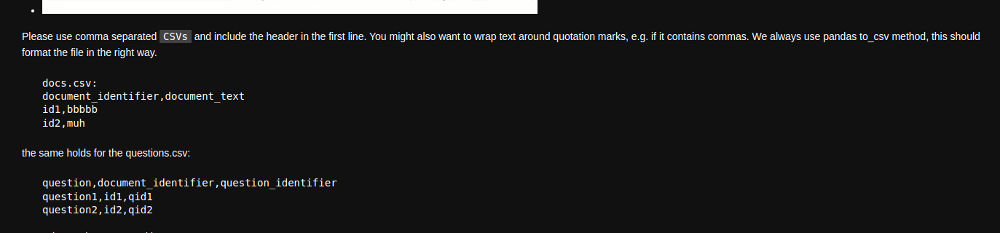

In [34]:
pd.set_option('display.max_colwidth', None)